<a href="https://colab.research.google.com/github/DiproHaque/Anomaly_Detection_Synthetic_Dataset/blob/main/Synthetic_Dataset_Curator_Final_V3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Core libraries
import pandas as pd
import numpy as np

# Date & time
from datetime import datetime, timedelta
import random


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
BASE_PATH = "/content/drive/MyDrive/Syn_DS/Profiles/"

FILES = {
    "amount": "Amount_Profile.xlsx",
    "txn_type": "Txn_Type_Profile.xlsx",
    "textual": "Texual_Profile.xlsx",
    "location": "Location_Profile.xlsx",
    "velocity": "Velocity_Profile.xlsx",
    "temporal": "Temporal_Profile.xlsx",
    "device": "Device_Network_Profile.xlsx"
}


In [ ]:
def load_excel(file_path):
    xls = pd.ExcelFile(file_path)
    sheets = {}
    for sheet in xls.sheet_names:
        sheets[sheet] = pd.read_excel(xls, sheet_name=sheet)
    return sheets


In [ ]:
profiles = {}

for key, file in FILES.items():
    full_path = BASE_PATH + file
    profiles[key] = load_excel(full_path)
    print(f"✅ Loaded: {file}")


✅ Loaded: Amount_Profile.xlsx
✅ Loaded: Txn_Type_Profile.xlsx
✅ Loaded: Texual_Profile.xlsx
✅ Loaded: Location_Profile.xlsx
✅ Loaded: Velocity_Profile.xlsx
✅ Loaded: Temporal_Profile.xlsx
✅ Loaded: Device_Network_Profile.xlsx


In [ ]:
# Amount
amount_by_source = profiles["amount"]["amount_by_source"]

# Txn Type
txn_type_dist = profiles["txn_type"]["txn_type_distribution"]

# Textual
particulars_template = profiles["textual"]["particulars_template"]
remarks_template = profiles["textual"]["remarks_template"]

# Location
country_dist = profiles["location"]["country_distribution"]
city_dist = profiles["location"]["city_distribution"]
location_switching = profiles["location"]["location_switching"]
geo_risk_rules = profiles["location"]["geo_risk_rules"]
city_coordinates = profiles["location"]["city_coordinates"]

# Velocity
user_class_dist = profiles["velocity"]["user_class_distribution"]
burst_pattern = profiles["velocity"]["burst_pattern"]
velocity_risk_rules = profiles["velocity"]["velocity_risk_rules"]
velocity_source_limit = profiles["velocity"]["velocity_source_limit"]

# Temporal
hourly_dist = profiles["temporal"]["hourly_distribution"]
day_type_dist = profiles["temporal"]["data_type_distribution"]
weekday_split = profiles["temporal"]["week_day_split"]
month_day_bias = profiles["temporal"]["month_day_bias"]
night_risk_flag = profiles["temporal"]["night_risk_flag"]

# Device & Network
device_dist = profiles["device"]["device_distribution"]
user_device_behavior = profiles["device"]["user_device_behavior"]
ip_behavior = profiles["device"]["ip_behavior"]
device_network_risk_rule = profiles["device"]["device_network_risk_rule"]
device_fingerprint = profiles["device"]["device_fingerprint"]


In [ ]:
def check_columns(df, expected_cols, name):
    missing = set(expected_cols) - set(df.columns)
    if missing:
        raise Exception(f"❌ {name} missing columns: {missing}")
    else:
        print(f"✔ {name} columns OK")

In [ ]:
# ========== Amount Profile ==========
check_columns(
    amount_by_source,
    ["Tran_Source", "Min", "Median", "P75", "P90", "Max", "Rounded_%"],
    "Amount Profile: amount_by_source"
)

# ========== Txn Type Profile ==========
check_columns(
    txn_type_dist,
    ["Txn_Type", "Txn_%"],
    "Txn Type Profile"
)

# ========== Textual Profile ==========
check_columns(
    particulars_template,
    ["Txn_Type", "Template"],
    "Textual Profile: particulars_template"
)

check_columns(
    remarks_template,
    ["Resp_Code", "Remark"],
    "Textual Profile: remarks_template"
)

# ========== Location Profile ==========
check_columns(
    country_dist,
    ["Country", "Txn_%"],
    "Location Profile: country_distribution"
)

check_columns(
    city_dist,
    ["City", "Txn_%"],
    "Location Profile: city_distribution"
)

check_columns(
    location_switching,
    ["Metric", "Value"],
    "Location Profile: location_switching"
)

check_columns(
    geo_risk_rules,
    ["Condition", "Risk_Level"],
    "Location Profile: geo_risk_rules"
)

check_columns(
    city_coordinates,
    ["City", "Latitude", "Longitude"],
    "Location Profile: city_coordinates"
)

# ========== Velocity Profile ==========
check_columns(
    user_class_dist,
    ["User_Class", "Txn_per_Day_Range", "User_%"],
    "Velocity Profile: user_class_distribution"
)

check_columns(
    burst_pattern,
    ["User_Class", "Max_Txn_in_10_Min", "Max_Txn_in_1_Hour"],
    "Velocity Profile: burst_pattern"
)

check_columns(
    velocity_risk_rules,
    ["Condition", "Risk_Level"],
    "Velocity Profile: velocity_risk_rules"
)

check_columns(
    velocity_source_limit,
    ["Tran_Source", "Max_Txn_per_Hour"],
    "Velocity Profile: velocity_source_limit"
)

# ========== Temporal Profile ==========
check_columns(
    hourly_dist,
    ["Hour", "Txn_%"],
    "Temporal Profile: hourly_distribution"
)

check_columns(
    day_type_dist,
    ["Day_Type", "Txn_%"],
    "Temporal Profile: data_type_distribution"
)

check_columns(
    weekday_split,
    ["Day", "Txn_%"],
    "Temporal Profile: week_day_split"
)

check_columns(
    month_day_bias,
    ["Day_of_Month", "Multiplier"],
    "Temporal Profile: month_day_bias"
)

check_columns(
    night_risk_flag,
    ["Hour_Range", "Risk_Flag"],
    "Temporal Profile: night_risk_flag"
)

# ========== Device & Network Profile ==========
check_columns(
    device_dist,
    ["Device_Type", "Txn_%"],
    "Device Profile: device_distribution"
)

check_columns(
    user_device_behavior,
    ["Metric", "Value"],
    "Device Profile: user_device_behavior"
)

check_columns(
    ip_behavior,
    ["Metric", "Value"],
    "Device Profile: ip_behavior"
)

check_columns(
    device_network_risk_rule,
    ["Condition", "Risk_Level"],
    "Device Profile: device_network_risk_rule"
)

check_columns(
    device_fingerprint,
    [
        "Attribute", "Example1", "Example2", "Example3", "Example4",
        "Example5", "Example6", "Example7", "Example8", "Example9",
        "Example10", "Example11", "Example12", "Example13"
    ],
    "Device Profile: device_fingerprint"
)



✔ Amount Profile: amount_by_source columns OK
✔ Txn Type Profile columns OK
✔ Textual Profile: particulars_template columns OK
✔ Textual Profile: remarks_template columns OK
✔ Location Profile: country_distribution columns OK
✔ Location Profile: city_distribution columns OK
✔ Location Profile: location_switching columns OK
✔ Location Profile: geo_risk_rules columns OK
✔ Location Profile: city_coordinates columns OK
✔ Velocity Profile: user_class_distribution columns OK
✔ Velocity Profile: burst_pattern columns OK
✔ Velocity Profile: velocity_risk_rules columns OK
✔ Velocity Profile: velocity_source_limit columns OK
✔ Temporal Profile: hourly_distribution columns OK
✔ Temporal Profile: data_type_distribution columns OK
✔ Temporal Profile: week_day_split columns OK
✔ Temporal Profile: month_day_bias columns OK
✔ Temporal Profile: night_risk_flag columns OK
✔ Device Profile: device_distribution columns OK
✔ Device Profile: user_device_behavior columns OK
✔ Device Profile: ip_behavior colu

In [ ]:
def weighted_choice(df, value_col, weight_col):
    return random.choices(
        df[value_col].tolist(),
        weights=df[weight_col].tolist(),
        k=1
    )[0]


In [ ]:
def generate_base_txn(txn_id):
    txn = {}

    txn["TXN_ID"] = txn_id
    txn["USER_ID"] = f"U{random.randint(1000,9999)}"

    # Txn Type
    txn["TXN_TYPE"] = weighted_choice(txn_type_dist, "Txn_Type", "Txn_%")

    # Source
    txn["TRAN_SOURCE"] = random.choice(amount_by_source["Tran_Source"].unique())

    # Country & City
    txn["COUNTRY"] = weighted_choice(country_dist, "Country", "Txn_%")
    txn["CITY"] = weighted_choice(city_dist, "City", "Txn_%")

    return txn


In [ ]:
sample = [generate_base_txn(i) for i in range(1,6)]
pd.DataFrame(sample)


,TXN_ID,USER_ID,TXN_TYPE,TRAN_SOURCE,COUNTRY,CITY
0,1,U2585,Merchant_Payment,MobileApp,Bangladesh,Narayanganj
1,2,U8403,Fund_Transfer,Internet,Bangladesh,Dhaka
2,3,U2112,Fund_Transfer,ATM,Bangladesh,Kustia
3,4,U5491,Cash_Withdrawal,MobileApp,Bangladesh,Others
4,5,U2706,Fund_Transfer,POS,Bangladesh,Sylhet


In [ ]:
import random
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import uuid
import math


In [ ]:
def weighted_choice(df, value_col, weight_col):
    return np.random.choice(
        df[value_col],
        p=df[weight_col] / df[weight_col].sum()
    )


In [ ]:
def generate_txn_id():
    return "TXN" + str(random.randint(10**9, 10**10 - 1))

def generate_user_id(user_pool):
    return random.choice(user_pool)
USER_POOL = [f"U{10000+i}" for i in range(2000)]


In [ ]:
def generate_txn_type():
    return weighted_choice(txn_type_dist, "Txn_Type", "Txn_%")
TRAN_SOURCES = amount_by_source["Tran_Source"].unique().tolist()

def generate_tran_source():
    return random.choice(TRAN_SOURCES)


In [ ]:
def generate_amount(tran_source):
    row = amount_by_source[amount_by_source["Tran_Source"] == tran_source].iloc[0]

    amount = np.random.triangular(
        row["Min"], row["Median"], row["P90"]
    )

    if random.random() < row["Rounded_%"] / 100:
        amount = round(amount)

    return round(amount, 2)


In [ ]:
def generate_timestamp():
    hour = weighted_choice(hourly_dist, "Hour", "Txn_%")
    day_offset = random.randint(0, 30)

    base_date = datetime.now() - timedelta(days=day_offset)

    return base_date.replace(
        hour=int(hour),
        minute=random.randint(0, 59),
        second=random.randint(0, 59)
    )


In [ ]:
def generate_city():
    return weighted_choice(city_dist, "City", "Txn_%")
def get_city_coordinates(city):
    row = city_coordinates[city_coordinates["City"] == city]
    if row.empty:
        return None, None
    return row.iloc[0]["Latitude"], row.iloc[0]["Longitude"]


In [ ]:
def generate_device():
    return weighted_choice(device_dist, "Device_Type", "Txn_%")
def generate_ip():
    return f"192.168.{random.randint(0,255)}.{random.randint(1,254)}"


In [ ]:
def generate_particulars(txn_type):
    rows = particulars_template[particulars_template["Txn_Type"] == txn_type]
    return random.choice(rows["Template"].tolist())
def generate_remarks(resp_code):
    rows = remarks_template[remarks_template["Resp_Code"] == resp_code]
    return random.choice(rows["Remark"].tolist())


In [ ]:
def generate_single_transaction():
    tran_source = generate_tran_source()
    txn_type = generate_txn_type()
    city = generate_city()
    lat, lon = get_city_coordinates(city)

    resp_code = random.choice([0, 0, 0, 12])  # success-heavy

    return {
        "Txn_ID": generate_txn_id(),
        "User_ID": generate_user_id(USER_POOL),
        "Tran_Source": tran_source,
        "Create_Date": generate_timestamp(),
        "Txn_Amount": generate_amount(tran_source),
        "From_Account": "AC" + str(random.randint(10**9, 10**10 - 1)),
        "To_Account": "AC" + str(random.randint(10**9, 10**10 - 1)),
        "Resp_Code": resp_code,
        "Tracer_No": random.randint(100000, 999999),
        "Txn_Type": txn_type,
        "Particulars": generate_particulars(txn_type),
        "Remarks": generate_remarks(resp_code),
        "Device": generate_device(),
        "IP_Address": generate_ip(),
        "Country": "Bangladesh",
        "city_name": city,
        "Latitude": lat,
        "Longitude": lon
    }


In [ ]:
def generate_dataset(n=10000):
    return pd.DataFrame([generate_single_transaction() for _ in range(n)])


In [ ]:
df = generate_dataset(5000)
df.head()


,Txn_ID,User_ID,Tran_Source,Create_Date,Txn_Amount,From_Account,To_Account,Resp_Code,Tracer_No,Txn_Type,Particulars,Remarks,Device,IP_Address,Country,city_name,Latitude,Longitude
0,TXN2597105177,U10973,MobileApp,2025-12-19 06:56:56.711048,7704.16,AC3688120421,AC9543131786,0,953768,Bill_Payment,Electricity Bill,Successful,Android,192.168.43.92,Bangladesh,Jessore,23.1710,89.2024
1,TXN4577909100,U11773,MobileApp,2026-01-01 19:28:47.715635,6507.70,AC1026145227,AC2917894053,0,351598,Merchant_Payment,POS Purchase,Successful,Web,192.168.192.194,Bangladesh,Narayanganj,23.6236,90.5000
2,TXN3684200363,U10598,ATM,2025-12-26 16:54:59.718980,9038.47,AC9608206988,AC1039469268,12,936000,Fund_Transfer,Transfer to {{BEN}},Invalid txn,POS,192.168.159.78,Bangladesh,Kustia,NaN,NaN
3,TXN2702834405,U11258,ATM,2025-12-29 16:30:24.722896,4937.02,AC2520144504,AC7202149483,12,158797,Cash_Withdrawal,ATM Cash Withdrawal,Invalid txn,Android,192.168.163.82,Bangladesh,Dhaka,23.8103,90.4125
4,TXN7724104712,U10864,POS,2025-12-17 09:57:45.726726,2179.86,AC1809382867,AC1803602344,0,363666,Fund_Transfer,Transfer to {{BEN}},Successful,iOS,192.168.209.149,Bangladesh,Dhaka,23.8103,90.4125


In [ ]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=df)

https://docs.google.com/spreadsheets/d/1Q1BXEp4trBA-kfwts5pIdTy-ZqJRC1zYYTVWAIP9WS4/edit#gid=0


In [ ]:
df = df.reset_index()
# 1️⃣ Ensure Create_Date is datetime
df["Create_Date"] = pd.to_datetime(df["Create_Date"])

# 2️⃣ Sort by User_ID & Create_Date
df = df.sort_values(["User_ID", "Create_Date"]).reset_index(drop=True)

# 3️⃣ Set index for time-based rolling
df = df.set_index("Create_Date")

# 4️⃣ 10-min rolling transaction count per user
df["Txn_Count_10_Min"] = (
    df.groupby("User_ID")["User_ID"]
      .rolling("10min")
      .count()  # count instead of size
      .reset_index(level=0, drop=True)
)

# 5️⃣ 1-hour rolling transaction count per user
df["Txn_Count_1_Hour"] = (
    df.groupby("User_ID")["User_ID"]
      .rolling("1h")
      .count()
      .reset_index(level=0, drop=True)
)

# 6️⃣ Reset index to have Create_Date as column again
df = df.reset_index()

# 7️⃣ Daily transaction count
df["Txn_Date"] = df["Create_Date"].dt.date
df["Txn_Count_Today"] = (
    df.groupby(["User_ID", "Txn_Date"])["Txn_ID"]
      .transform("count")
)

# 8️⃣ Assign User_Class from profile
def assign_user_class():
    return weighted_choice(user_class_dist, "User_Class", "User_%")

user_class_map = {user: assign_user_class() for user in df["User_ID"].unique()}
df["User_Class"] = df["User_ID"].map(user_class_map)

# 9️⃣ Velocity burst flags (10 min & 1 hour) using burst_pattern profile
burst_lookup = burst_pattern.set_index("User_Class")

df["Velocity_Flag_10_Min"] = df.apply(
    lambda r: int(r["Txn_Count_10_Min"] > burst_lookup.loc[r["User_Class"], "Max_Txn_in_10_Min"]),
    axis=1
)


In [ ]:
# 1️⃣ Ensure all required velocity flags exist
required_flags = ["Velocity_Flag_10_Min", "Velocity_Flag_1_Hour", "Velocity_Source_Flag"]

for col in required_flags:
    if col not in df.columns:
        df[col] = 0  # safe default

# 2️⃣ Assign User_Class if missing
if "User_Class" not in df.columns:
    def assign_user_class():
        return weighted_choice(user_class_dist, "User_Class", "User_%")
    user_class_map = {user: assign_user_class() for user in df["User_ID"].unique()}
    df["User_Class"] = df["User_ID"].map(user_class_map)

# 3️⃣ Recreate missing burst flags if any
burst_lookup = burst_pattern.set_index("User_Class")

if "Velocity_Flag_10_Min" not in df.columns:
    df["Velocity_Flag_10_Min"] = df.apply(
        lambda r: int(r["Txn_Count_10_Min"] > burst_lookup.loc[r["User_Class"], "Max_Txn_in_10_Min"]),
        axis=1
    )

if "Velocity_Flag_1_Hour" not in df.columns:
    df["Velocity_Flag_1_Hour"] = df.apply(
        lambda r: int(r["Txn_Count_1_Hour"] > burst_lookup.loc[r["User_Class"], "Max_Txn_in_1_Hour"]),
        axis=1
    )

if "Velocity_Source_Flag" not in df.columns:
    source_limit = velocity_source_limit.set_index("Tran_Source")
    df["Velocity_Source_Flag"] = df.apply(
        lambda r: int(
            r["Txn_Count_1_Hour"] > source_limit.loc[r["Tran_Source"], "Max_Txn_per_Hour"]
            if r["Tran_Source"] in source_limit.index else 0
        ),
        axis=1
    )

# 4️⃣ Map velocity flags to Risk_Level
def map_velocity_risk(row):
    flags = [row["Velocity_Flag_10_Min"], row["Velocity_Flag_1_Hour"], row["Velocity_Source_Flag"]]
    count = sum(flags)

    if count >= 2:
        return "High"
    elif count == 1:
        return "Medium"
    else:
        return "Low"

df["Velocity_Risk"] = df.apply(map_velocity_risk, axis=1)

# 5️⃣ Sanity check (top 10)
df[["User_ID", "Create_Date", "Txn_Count_10_Min", "Txn_Count_1_Hour",
    "Txn_Count_Today", "User_Class", "Velocity_Flag_10_Min",
    "Velocity_Flag_1_Hour", "Velocity_Source_Flag", "Velocity_Risk"]].head(10)


,User_ID,Create_Date,Txn_Count_10_Min,Txn_Count_1_Hour,Txn_Count_Today,User_Class,Velocity_Flag_10_Min,Velocity_Flag_1_Hour,Velocity_Source_Flag,Velocity_Risk
0,U10000,2026-01-04 20:05:23.823053,1.0,1.0,1,Medium,0,0,0,Low
1,U10001,2025-12-08 15:40:39.058959,1.0,1.0,1,Medium,0,0,0,Low
2,U10001,2025-12-10 19:06:06.727482,1.0,1.0,1,Medium,0,0,0,Low
3,U10001,2025-12-12 12:08:32.562809,1.0,1.0,1,Medium,0,0,0,Low
4,U10001,2025-12-28 12:44:30.467392,1.0,1.0,1,Medium,0,0,0,Low
5,U10001,2026-01-02 13:25:17.978909,1.0,1.0,1,Medium,0,0,0,Low
6,U10002,2026-01-04 12:58:07.678215,1.0,1.0,1,High,0,0,0,Low
7,U10003,2025-12-10 10:45:03.103420,1.0,1.0,1,Low,0,0,0,Low
8,U10003,2025-12-18 00:58:15.614051,1.0,1.0,1,Low,0,0,0,Low
9,U10003,2026-01-03 10:06:02.591977,1.0,1.0,1,Low,0,0,0,Low


In [ ]:
df.head(20)  # প্রথম 20 rows


,Create_Date,index,Txn_ID,User_ID,Tran_Source,Txn_Amount,From_Account,To_Account,Resp_Code,Tracer_No,...,Longitude,Txn_Count_10_Min,Txn_Count_1_Hour,Txn_Date,Txn_Count_Today,User_Class,Velocity_Flag_10_Min,Velocity_Flag_1_Hour,Velocity_Source_Flag,Velocity_Risk
0,2026-01-04 20:05:23.823053,4808,TXN2436876312,U10000,MobileApp,9478.84,AC3330205983,AC3870573908,0,503018,...,91.4000,1.0,1.0,2026-01-04,1,Medium,0,0,0,Low
1,2025-12-08 15:40:39.058959,2547,TXN8870500550,U10001,ATM,16038.22,AC9878267825,AC3399238427,0,986211,...,89.2752,1.0,1.0,2025-12-08,1,Medium,0,0,0,Low
2,2025-12-10 19:06:06.727482,3857,TXN1519780527,U10001,MobileApp,9785.61,AC1613107824,AC8312519705,0,224668,...,89.2752,1.0,1.0,2025-12-10,1,Medium,0,0,0,Low
3,2025-12-12 12:08:32.562809,1525,TXN4041189734,U10001,MobileApp,2179.24,AC5641517210,AC8384799400,0,147563,...,90.5000,1.0,1.0,2025-12-12,1,Medium,0,0,0,Low
4,2025-12-28 12:44:30.467392,1498,TXN3008964183,U10001,ATM,2348.16,AC8824089648,AC7021813342,0,302013,...,90.4125,1.0,1.0,2025-12-28,1,Medium,0,0,0,Low
5,2026-01-02 13:25:17.978909,3975,TXN2509492163,U10001,POS,2884.46,AC8596001900,AC4466821034,0,705166,...,90.5000,1.0,1.0,2026-01-02,1,Medium,0,0,0,Low
6,2026-01-04 12:58:07.678215,3834,TXN1113616578,U10002,MobileApp,6372.23,AC2856445705,AC4461667517,0,288406,...,91.7832,1.0,1.0,2026-01-04,1,High,0,0,0,Low
7,2025-12-10 10:45:03.103420,4032,TXN3351839786,U10003,MobileApp,1104.77,AC4953772141,AC2144325435,0,406287,...,89.2752,1.0,1.0,2025-12-10,1,Low,0,0,0,Low
8,2025-12-18 00:58:15.614051,956,TXN8560250471,U10003,Internet,28171.55,AC8319254265,AC8327491751,12,864079,...,89.2752,1.0,1.0,2025-12-18,1,Low,0,0,0,Low
9,2026-01-03 10:06:02.591977,4701,TXN1643826788,U10003,MobileApp,1705.60,AC8119721190,AC5378114167,0,464436,...,90.5000,1.0,1.0,2026-01-03,1,Low,0,0,0,Low


In [ ]:
original_columns = [
    "Txn_ID", "User_ID", "Tran_Source", "Create_Date", "Txn_Amount",
    "From_Account", "To_Account", "Resp_Code", "Tracer_No",
    "Txn_Type", "Particulars", "Remarks", "Device", "IP_Address",
    "Country", "city_name", "Latitude", "Longitude"
]

# Slice the original dataset (features only)
df_original = df[original_columns].copy()

# CSV export
df_original.to_csv("synthetic_dataset_original.csv", index=False)

print("✅ Original synthetic dataset saved as 'synthetic_dataset_original.csv'")

✅ Original synthetic dataset saved as 'synthetic_dataset_original.csv'


In [ ]:
df["Fraud_Label"] = (
    (df["Velocity_Risk"] == "High") |
    ((df.get("Night_Risk_Flag", 0) == 1) & (df.get("Geo_Risk_Flag", 0) == 1)) |
    (df["Txn_Amount"] > df["Txn_Amount"].quantile(0.99))
).astype(int)

df["Fraud_Label"].value_counts()


,count
Fraud_Label,
0,4950
1,50


In [ ]:
ml_features = [
    "Txn_Amount",
    "Txn_Count_10_Min",
    "Txn_Count_1_Hour",
    "Txn_Count_Today",
    "Velocity_Flag_10_Min",
    "Velocity_Flag_1_Hour",
    "Velocity_Source_Flag"
]


In [ ]:
from sklearn.model_selection import train_test_split

X = df[ml_features]
y = df["Fraud_Label"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)



In [ ]:
from sklearn.linear_model import LogisticRegression

log_model = LogisticRegression(max_iter=1000)
log_model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [ ]:
from sklearn.metrics import classification_report

y_pred_log = log_model.predict(X_test)
print("Logistic Regression Result")
print(classification_report(y_test, y_pred_log))


Logistic Regression Result
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1485
           1       1.00      1.00      1.00        15

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [ ]:
!pip install shap


In [ ]:
import shap

explainer = shap.Explainer(log_model, X_train)
shap_values = explainer(X_test)


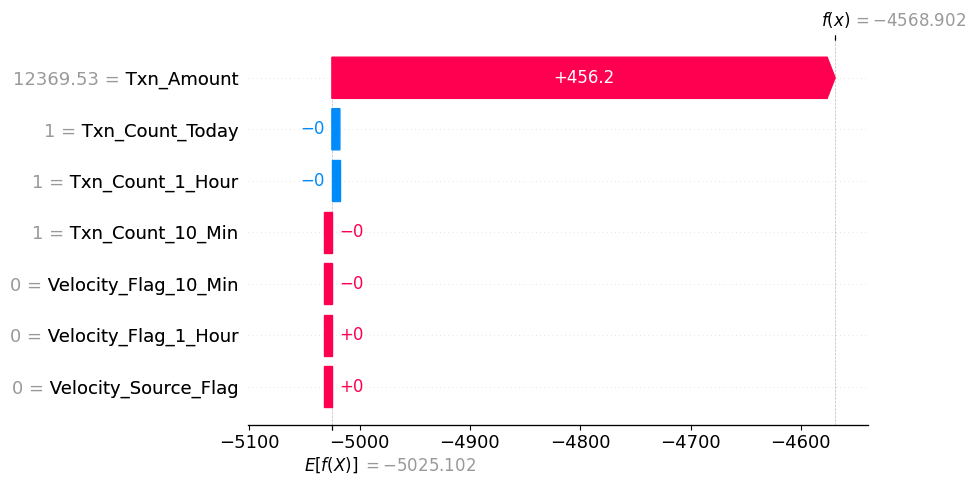

In [ ]:
shap.plots.waterfall(shap_values[0])


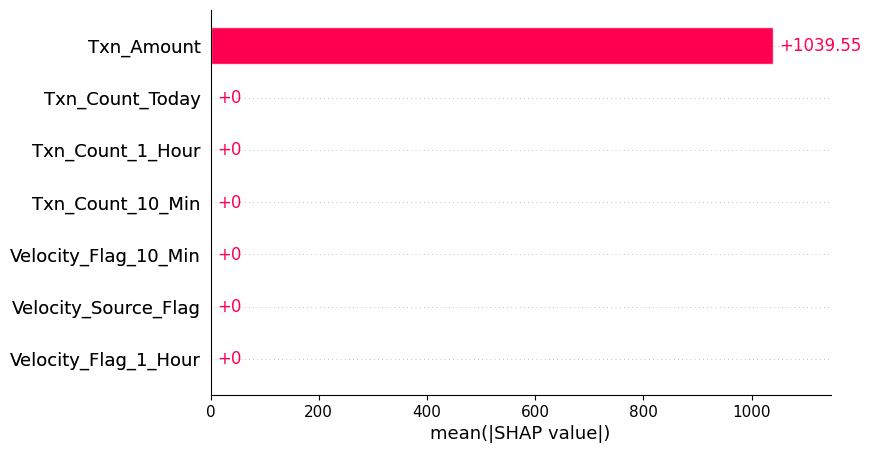

In [ ]:
shap.plots.bar(shap_values)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(
    n_estimators=200,
    max_depth=8,
    random_state=42,
    class_weight="balanced"
)

rf_model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', max_depth=8, n_estimators=200,
                       random_state=42)

In [ ]:
from sklearn.metrics import classification_report

y_pred_rf = rf_model.predict(X_test)
print("Random Forest Result")
print(classification_report(y_test, y_pred_rf))


Random Forest Result
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1485
           1       1.00      1.00      1.00        15

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [ ]:
import shap

explainer_rf = shap.TreeExplainer(rf_model)
shap_values_rf = explainer_rf.shap_values(X_test)


In [ ]:
import shap

explainer_rf = shap.Explainer(rf_model, X_train)
shap_values_rf = explainer_rf(X_test)


In [ ]:
shap_values_rf.feature_names = X_test.columns.tolist()


In [ ]:
import shap
explainer_rf = shap.Explainer(rf_model, X_train)
shap_values_rf = explainer_rf(X_test)
type(shap_values_rf)  # should be shap._explanation.Explanation
shap_values_rf.shape   # should match (num_samples, num_features)


(1500, 7, 2)

In [ ]:
# Take shap values for positive class only
shap_values_pos = shap_values_rf.values[:,:,1] if shap_values_rf.values.ndim == 3 else shap_values_rf.values


In [ ]:
shap_expl = shap.Explanation(
    shap_values_pos,
    base_values=shap_values_rf.base_values if hasattr(shap_values_rf, 'base_values') else shap_values_rf.base_values,
    data=X_test,
    feature_names=X_test.columns.tolist()
)


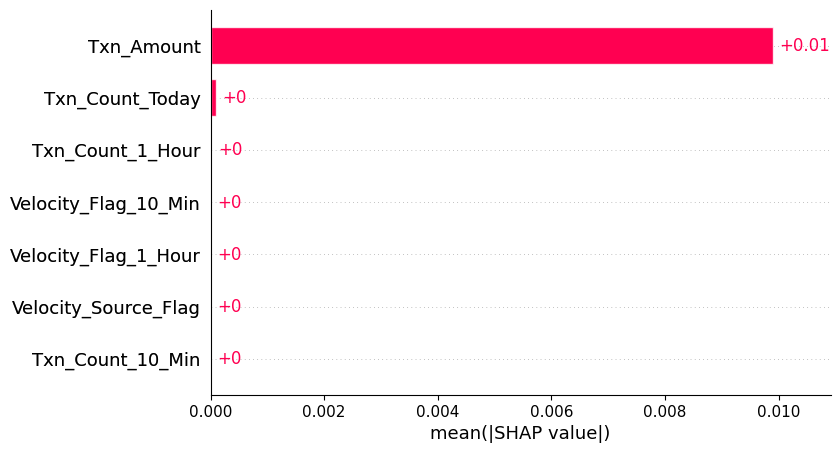

In [ ]:
shap.plots.bar(shap_expl)


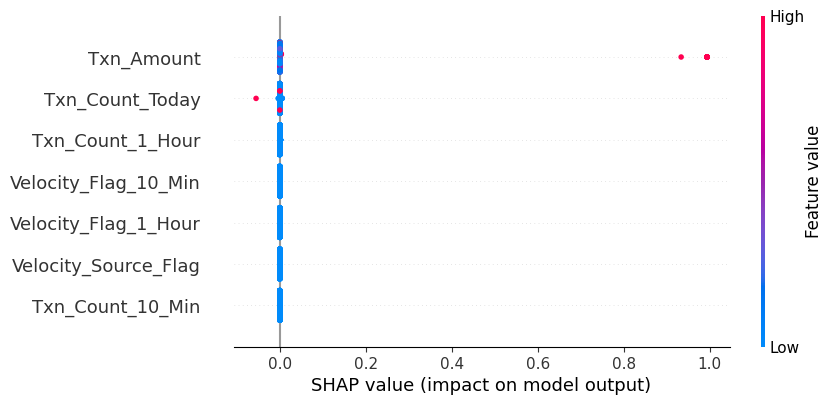

In [ ]:
shap.plots.beeswarm(shap_expl)



In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import shap


In [ ]:
gb_model = GradientBoostingClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=5,
    random_state=42
)

gb_model.fit(X_train, y_train)


GradientBoostingClassifier(max_depth=5, n_estimators=200, random_state=42)

In [ ]:
y_pred_gb = gb_model.predict(X_test)
print("Gradient Boosting Classifier Result")
print(classification_report(y_test, y_pred_gb))


Gradient Boosting Classifier Result
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1485
           1       1.00      1.00      1.00        15

    accuracy                           1.00      1500
   macro avg       1.00      1.00      1.00      1500
weighted avg       1.00      1.00      1.00      1500



In [ ]:
# Unified SHAP Explainer
explainer_gb = shap.Explainer(gb_model, X_train)
shap_values_gb = explainer_gb(X_test)


In [ ]:
# Binary classifier → select positive class if needed
shap_values_pos = shap_values_gb.values[:,:,1] if shap_values_gb.values.ndim == 3 else shap_values_gb.values

shap_expl_gb = shap.Explanation(
    shap_values_pos,
    base_values=shap_values_gb.base_values if hasattr(shap_values_gb, 'base_values') else shap_values_gb.base_values,
    data=X_test,
    feature_names=X_test.columns.tolist()
)


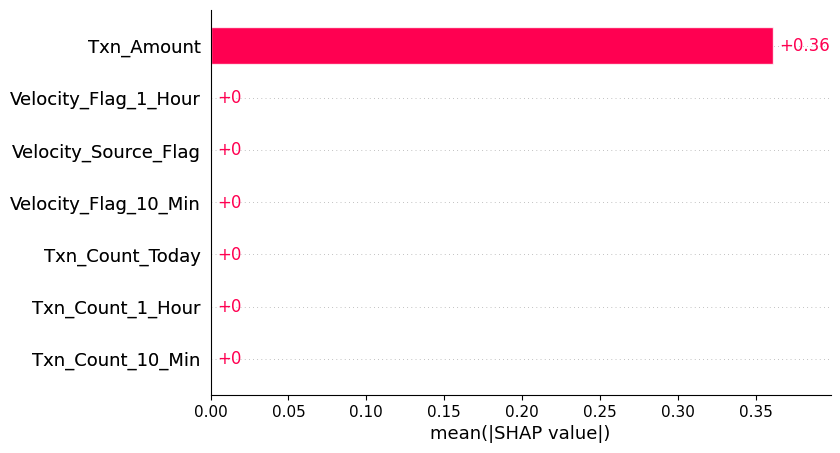

In [ ]:
shap.plots.bar(shap_expl_gb)


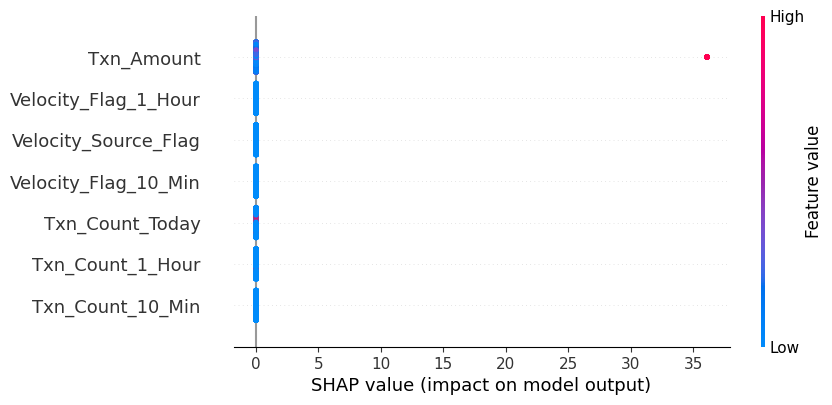

In [ ]:
shap.plots.beeswarm(shap_expl_gb)


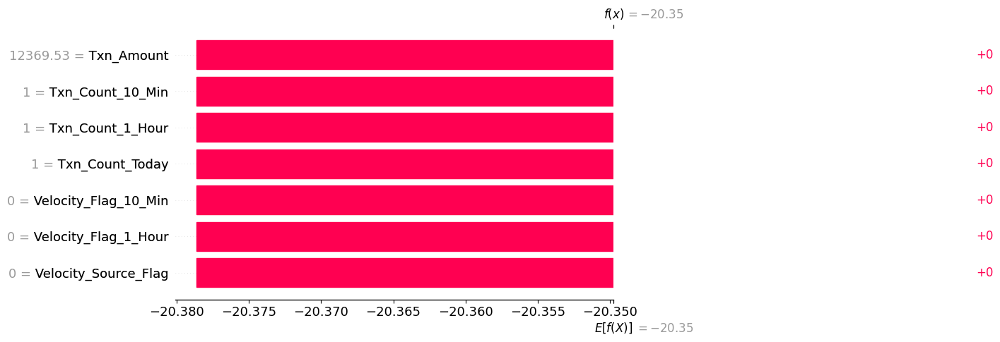

In [ ]:
shap.plots.waterfall(shap_expl_gb[0])


In [ ]:
import shap

# Logistic Regression model ধরে নিই: log_model
explainer_log = shap.Explainer(log_model, X_train)
shap_values_log = explainer_log(X_test)

# Fix 3D issue & assign feature names
shap_values_pos_log = shap_values_log.values[:,:,1] if shap_values_log.values.ndim == 3 else shap_values_log.values

shap_expl_log = shap.Explanation(
    shap_values_pos_log,
    base_values=shap_values_log.base_values if hasattr(shap_values_log, 'base_values') else shap_values_log.base_values,
    data=X_test,
    feature_names=X_test.columns.tolist()
)


In [ ]:
import pandas as pd

# 1️⃣ Extract mean absolute SHAP values for each model
def mean_abs_shap(shap_expl):
    # shap_expl.values already 2D: (num_samples, num_features)
    import numpy as np
    return pd.Series(np.abs(shap_expl.values).mean(axis=0), index=shap_expl.feature_names)

shap_log_df = mean_abs_shap(shap_expl_log).sort_values(ascending=False)
shap_rf_df  = mean_abs_shap(shap_expl).sort_values(ascending=False)
shap_gb_df  = mean_abs_shap(shap_expl_gb).sort_values(ascending=False)

# 2️⃣ Combine into one dataframe
shap_compare = pd.DataFrame({
    "Logistic_SHAP": shap_log_df,
    "RandomForest_SHAP": shap_rf_df,
    "GradientBoosting_SHAP": shap_gb_df
})

# 3️⃣ Normalize each column (optional, 0-1 scale for comparison)
shap_compare_norm = shap_compare / shap_compare.max()

# 4️⃣ Sort by max SHAP across all models
shap_compare_norm["Max_SHAP"] = shap_compare_norm.max(axis=1)
shap_compare_norm = shap_compare_norm.sort_values("Max_SHAP", ascending=False).drop(columns=["Max_SHAP"])

# 5️⃣ Display top 15 features
shap_compare_norm.head(15)


,Logistic_SHAP,RandomForest_SHAP,GradientBoosting_SHAP
Txn_Amount,1.000000e+00,1.000000,1.0
Txn_Count_Today,3.233181e-07,0.008728,0.0
Txn_Count_1_Hour,1.071627e-10,0.001494,0.0
Txn_Count_10_Min,1.761347e-11,0.000000,0.0
Velocity_Flag_10_Min,0.000000e+00,0.000000,0.0
Velocity_Flag_1_Hour,0.000000e+00,0.000000,0.0
Velocity_Source_Flag,0.000000e+00,0.000000,0.0


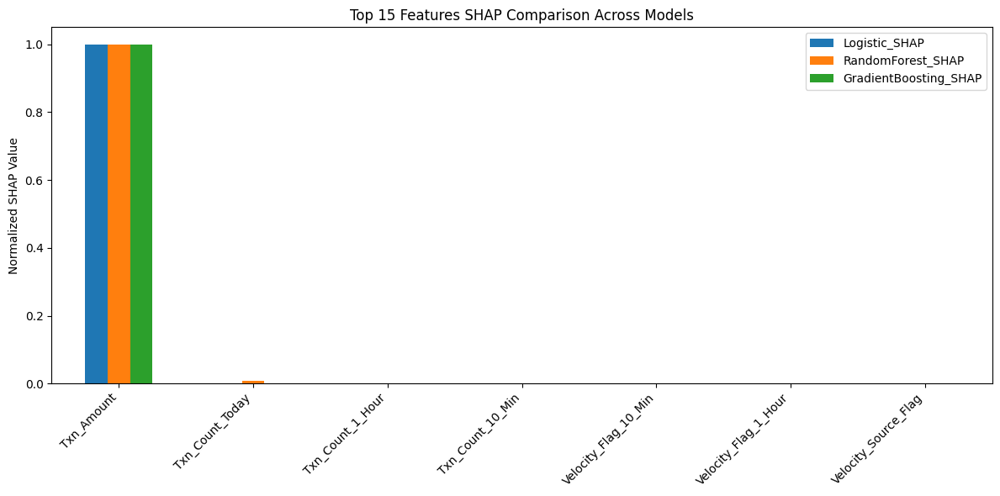

In [ ]:
import matplotlib.pyplot as plt

shap_compare_norm.head(15).plot(kind="bar", figsize=(12,6))
plt.title("Top 15 Features SHAP Comparison Across Models")
plt.ylabel("Normalized SHAP Value")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


,Logistic_SHAP,RandomForest_SHAP,GradientBoosting_SHAP
Txn_Amount,1.000000e+00,1.000000,1.0
Txn_Count_Today,3.233181e-07,0.008728,0.0
Txn_Count_1_Hour,1.071627e-10,0.001494,0.0
Txn_Count_10_Min,1.761347e-11,0.000000,0.0
Velocity_Flag_10_Min,0.000000e+00,0.000000,0.0
Velocity_Flag_1_Hour,0.000000e+00,0.000000,0.0
Velocity_Source_Flag,0.000000e+00,0.000000,0.0


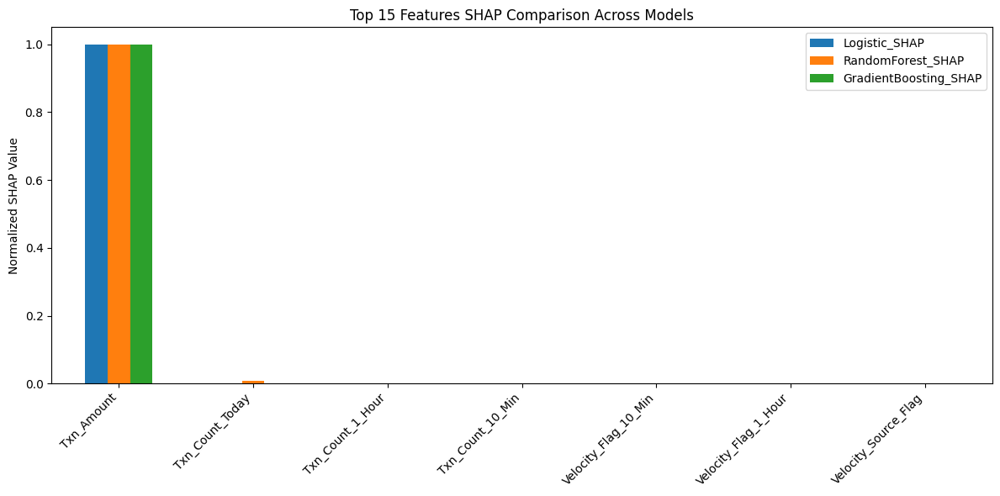

In [ ]:
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1️⃣ Logistic Regression Explainer
explainer_log = shap.Explainer(log_model, X_train)
shap_values_log = explainer_log(X_test)

shap_values_pos_log = shap_values_log.values[:,:,1] if shap_values_log.values.ndim == 3 else shap_values_log.values
shap_expl_log = shap.Explanation(
    shap_values_pos_log,
    base_values=shap_values_log.base_values if hasattr(shap_values_log, 'base_values') else shap_values_log.base_values,
    data=X_test,
    feature_names=X_test.columns.tolist()
)

# 2️⃣ Random Forest Explainer (already trained)
shap_values_pos_rf = shap_values_rf.values[:,:,1] if shap_values_rf.values.ndim == 3 else shap_values_rf.values
shap_expl_rf = shap.Explanation(
    shap_values_pos_rf,
    base_values=shap_values_rf.base_values if hasattr(shap_values_rf, 'base_values') else shap_values_rf.base_values,
    data=X_test,
    feature_names=X_test.columns.tolist()
)

# 3️⃣ Gradient Boosting Explainer (already trained)
shap_values_pos_gb = shap_expl_gb.values if shap_expl_gb.values.ndim == 2 else shap_expl_gb.values[:,:,1]
shap_expl_gb_fixed = shap.Explanation(
    shap_values_pos_gb,
    base_values=shap_expl_gb.base_values,
    data=X_test,
    feature_names=X_test.columns.tolist()
)

# 4️⃣ Function to compute mean absolute SHAP
def mean_abs_shap(shap_expl):
    return pd.Series(np.abs(shap_expl.values).mean(axis=0), index=shap_expl.feature_names)

shap_log_df = mean_abs_shap(shap_expl_log).sort_values(ascending=False)
shap_rf_df  = mean_abs_shap(shap_expl_rf).sort_values(ascending=False)
shap_gb_df  = mean_abs_shap(shap_expl_gb_fixed).sort_values(ascending=False)

# 5️⃣ Combine into one dataframe
shap_compare = pd.DataFrame({
    "Logistic_SHAP": shap_log_df,
    "RandomForest_SHAP": shap_rf_df,
    "GradientBoosting_SHAP": shap_gb_df
})

# 6️⃣ Normalize each column (0-1) for easy comparison
shap_compare_norm = shap_compare / shap_compare.max()

# 7️⃣ Sort by max SHAP across all models
shap_compare_norm["Max_SHAP"] = shap_compare_norm.max(axis=1)
shap_compare_norm = shap_compare_norm.sort_values("Max_SHAP", ascending=False).drop(columns=["Max_SHAP"])

# 8️⃣ Display top 15 features
display(shap_compare_norm.head(15))

# 9️⃣ Bar chart visualization
shap_compare_norm.head(15).plot(kind="bar", figsize=(12,6))
plt.title("Top 15 Features SHAP Comparison Across Models")
plt.ylabel("Normalized SHAP Value")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=2c00fa4fbe60a62e47b3890db957337c5760389b1e4ce9b6ef2b5588e6f8af58
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:

from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# 2️⃣ Prepare data for LIME
feature_names = X_train.columns.tolist()
class_names = ["Non-Fraud", "Fraud"]

explainer_lime = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=feature_names,
    class_names=class_names,
    mode="classification"
)

# 3️⃣ Pick a single transaction to explain
i = 0  # first transaction in test set
transaction = X_test.iloc[i].values.reshape(1, -1)

# 4️⃣ Explain the transaction
exp = explainer_lime.explain_instance(
    data_row=transaction[0],
    predict_fn=rf_model.predict_proba,  # model's probability function
    num_features=10
)

# 5️⃣ Show explanation in notebook
exp.show_in_notebook(show_table=True)

# 6️⃣ Optional: Save explanation to HTML
exp.save_to_file(f"lime_explanation_transaction_{i}.html")


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# 1️⃣ Feature names & class names
feature_names = X_train.columns.tolist()
class_names = ["Non-Fraud", "Fraud"]

# 2️⃣ Create LIME Explainer
explainer_lime_lr = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=feature_names,
    class_names=class_names,
    mode="classification"
)

# 3️⃣ Pick a single transaction to explain
i = 0  # first transaction in test set
transaction = X_test.iloc[i].values.reshape(1, -1)

# 4️⃣ Explain the transaction using Logistic Regression
exp_lr = explainer_lime_lr.explain_instance(
    data_row=transaction[0],
    predict_fn=log_model.predict_proba,
    num_features=10
)

# 5️⃣ Show explanation in notebook
exp_lr.show_in_notebook(show_table=True)

# 6️⃣ Optional: Save explanation to HTML
#exp_lr.save_to_file(f"lime_explanation_lr_transaction_{i}.html")


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# 1️⃣ Feature names & class names
feature_names = X_train.columns.tolist()
class_names = ["Non-Fraud", "Fraud"]

# 2️⃣ Create LIME Explainer
explainer_lime_gb = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=feature_names,
    class_names=class_names,
    mode="classification"
)

# 3️⃣ Pick a single transaction to explain
i = 0  # first transaction in test set
transaction = X_test.iloc[i].values.reshape(1, -1)

# 4️⃣ Explain the transaction using Gradient Boosting
exp_gb = explainer_lime_gb.explain_instance(
    data_row=transaction[0],
    predict_fn=gb_model.predict_proba,
    num_features=10
)

# 5️⃣ Show explanation in notebook
exp_gb.show_in_notebook(show_table=True)

# 6️⃣ Optional: Save explanation to HTML
exp_gb.save_to_file(f"lime_explanation_gb_transaction_{i}.html")


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(


,Logistic_SHAP,RandomForest_SHAP,GradientBoosting_SHAP
Txn_Amount > 11204.33,1.000000,1.000000,1.000000
Velocity_Flag_10_Min <= 0.00,0.475624,0.253928,0.011499
Txn_Count_1_Hour <= 1.00,0.403241,0.196878,0.179193
Txn_Count_Today <= 1.00,0.170470,0.063406,0.357939
Txn_Count_10_Min <= 1.00,0.006835,0.002652,0.000000
Txn_Amount,0.000000,0.000000,0.000000
Txn_Count_1_Hour,0.000000,0.000000,0.000000
Txn_Count_10_Min,0.000000,0.000000,0.000000
Txn_Count_Today,0.000000,0.000000,0.000000
Velocity_Flag_10_Min,0.000000,0.000000,0.000000


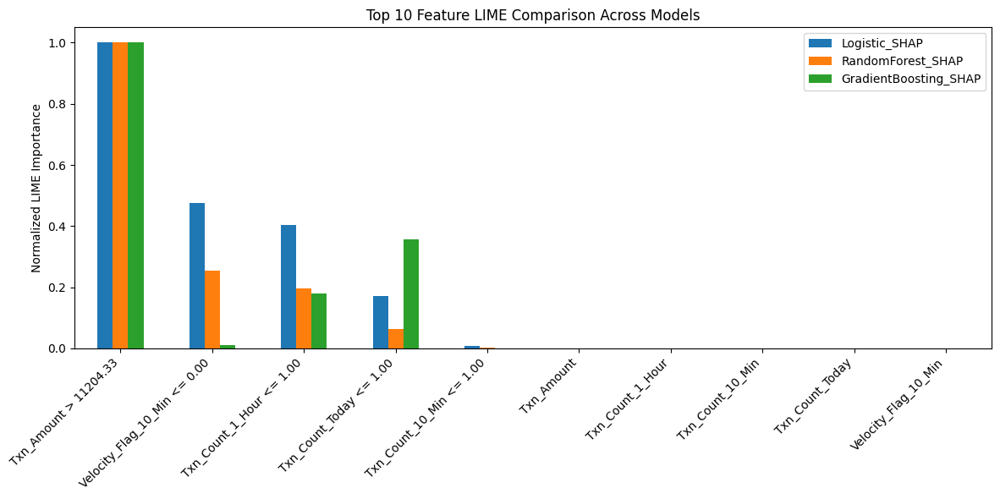

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1️⃣ Function to get LIME feature importance as absolute values
def lime_feature_importance(exp, feature_names):
    """
    exp: LIME explanation object
    feature_names: List of all feature names
    returns: Series with all features, missing ones filled 0
    """
    imp_dict = {f:0 for f in feature_names}
    for f, val in exp.as_list():
        imp_dict[f] = abs(val)
    return pd.Series(imp_dict)

# 2️⃣ Compute LIME importance for each model
lime_log_df = lime_feature_importance(exp_lr, X_test.columns)
lime_rf_df  = lime_feature_importance(exp, X_test.columns)
lime_gb_df  = lime_feature_importance(exp_gb, X_test.columns)

# 3️⃣ Combine into a single dataframe
lime_compare = pd.DataFrame({
    "Logistic_SHAP": lime_log_df,   # naming kept same as SHAP for consistency
    "RandomForest_SHAP": lime_rf_df,
    "GradientBoosting_SHAP": lime_gb_df
})

# 4️⃣ Normalize 0-1 for easy comparison
lime_compare_norm = lime_compare / lime_compare.max()

# 5️⃣ Sort by max importance across models
lime_compare_norm["Max_LIME"] = lime_compare_norm.max(axis=1)
lime_compare_norm = lime_compare_norm.sort_values("Max_LIME", ascending=False).drop(columns=["Max_LIME"])

# 6️⃣ Show top 10 features
display(lime_compare_norm.head(10))

# 7️⃣ Bar chart visualization
lime_compare_norm.head(10).plot(kind="bar", figsize=(12,6))
plt.title("Top 10 Feature LIME Comparison Across Models")
plt.ylabel("Normalized LIME Importance")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
!pip install eli5

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.4/108.4 kB 3.2 MB/s eta 0:00:00


In [ ]:
import eli5
from IPython.display import display

# Random Forest Global Feature Importance
print("=== Random Forest Global Feature Importance ===")
display(eli5.show_weights(rf_model, feature_names=X_train.columns.tolist(), top=20))

# Random Forest Local Explanation for a single transaction
i = 0  # first transaction in test set
print("\n=== Random Forest Local Explanation for Transaction {} ===".format(i))
display(eli5.show_prediction(rf_model, X_test.iloc[i], feature_names=X_test.columns.tolist(), top=10))


=== Random Forest Global Feature Importance ===


Weight,Feature
0.9903 ± 0.0312,Txn_Amount
0.0086 ± 0.0311,Txn_Count_Today
0.0010 ± 0.0027,Txn_Count_1_Hour
0.0000 ± 0.0002,Txn_Count_10_Min
0.0000 ± 0.0001,Velocity_Flag_10_Min
0 ± 0.0000,Velocity_Flag_1_Hour
0 ± 0.0000,Velocity_Source_Flag



=== Random Forest Local Explanation for Transaction 0 ===


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: U

In [ ]:
# Logistic Regression Global Feature Importance
print("=== Logistic Regression Global Feature Importance ===")
display(eli5.show_weights(log_model, feature_names=X_train.columns.tolist(), top=20))

# Logistic Regression Local Explanation for a single transaction
i = 0
print("\n=== Logistic Regression Local Explanation for Transaction {} ===".format(i))
display(eli5.show_prediction(log_model, X_test.iloc[i], feature_names=X_test.columns.tolist(), top=10))


=== Logistic Regression Global Feature Importance ===


Weight?,Feature
+0.161,Txn_Amount
+0.002,Txn_Count_Today
+0.000,Txn_Count_1_Hour
-0.000,Velocity_Flag_10_Min
-0.000,Txn_Count_10_Min
-6565.310,<BIAS>



=== Logistic Regression Local Explanation for Transaction 0 ===


In [ ]:
# Gradient Boosting Global Feature Importance
print("=== Gradient Boosting Global Feature Importance ===")
display(eli5.show_weights(gb_model, feature_names=X_train.columns.tolist(), top=20))

# Gradient Boosting Local Explanation for a single transaction
i = 0
print("\n=== Gradient Boosting Local Explanation for Transaction {} ===".format(i))
display(eli5.show_prediction(gb_model, X_test.iloc[i], feature_names=X_test.columns.tolist(), top=10))


=== Gradient Boosting Global Feature Importance ===


Weight,Feature
1.0000 ± 0.9507,Txn_Amount
0 ± 0.0000,Velocity_Flag_1_Hour
0 ± 0.0000,Velocity_Source_Flag
0 ± 0.0000,Velocity_Flag_10_Min
0 ± 0.0000,Txn_Count_Today
0 ± 0.0000,Txn_Count_1_Hour
0 ± 0.0000,Txn_Count_10_Min



=== Gradient Boosting Local Explanation for Transaction 0 ===


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but DecisionTreeRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWa

,RandomForest,LogisticRegression,GradientBoosting
feature,,,
Txn_Amount,1.000000,1.000000e+00,1.0
Txn_Count_Today,0.008725,1.347354e-02,0.0
Txn_Count_1_Hour,0.000990,4.533020e-05,0.0
Txn_Count_10_Min,0.000027,-1.701708e-04,0.0
Velocity_Flag_10_Min,0.000017,-7.850495e-07,0.0
<BIAS>,0.000000,-4.067800e+04,0.0
Velocity_Flag_1_Hour,0.000000,0.000000e+00,0.0
Velocity_Source_Flag,0.000000,0.000000e+00,0.0


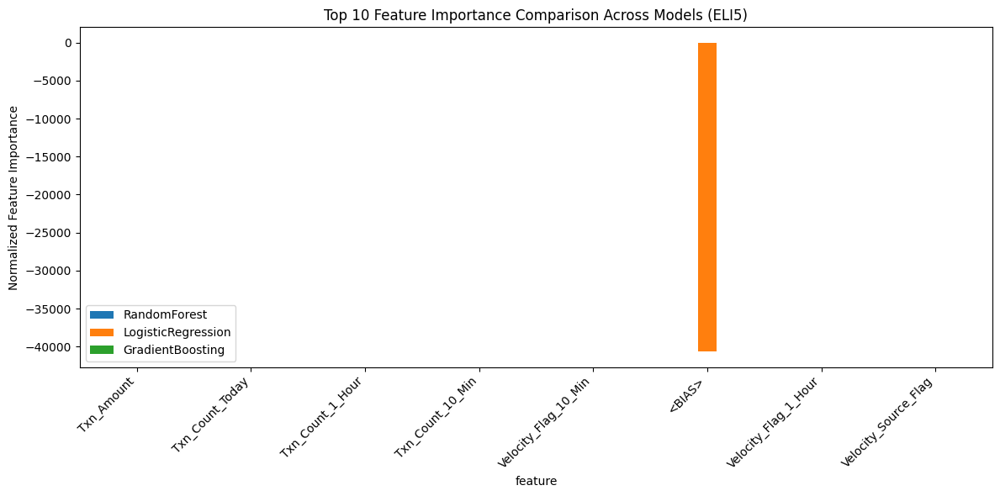

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import eli5

# 1️⃣ Get feature weights as dataframe function
def eli5_feature_weights(model, feature_names):
    """
    model: trained model
    feature_names: list of column names
    returns: Series with feature -> weight/importance
    """
    weights = eli5.explain_weights_df(model, feature_names=feature_names)
    # For tree-based models, 'weight' is importance
    return weights.set_index('feature')['weight']

# 2️⃣ Extract feature importance for each model
rf_weights = eli5_feature_weights(rf_model, X_train.columns.tolist())
lr_weights = eli5_feature_weights(log_model, X_train.columns.tolist())
gb_weights = eli5_feature_weights(gb_model, X_train.columns.tolist())

# 3️⃣ Combine into single dataframe
compare_df = pd.DataFrame({
    "RandomForest": rf_weights,
    "LogisticRegression": lr_weights,
    "GradientBoosting": gb_weights
}).fillna(0)  # missing features filled with 0

# 4️⃣ Normalize 0-1 for easy comparison
compare_norm = compare_df / compare_df.max()

# 5️⃣ Sort by max importance across models
compare_norm["Max_Importance"] = compare_norm.max(axis=1)
compare_norm = compare_norm.sort_values("Max_Importance", ascending=False).drop(columns=["Max_Importance"])

# 6️⃣ Show top 10 features
display(compare_norm.head(10))

# 7️⃣ Bar chart visualization
compare_norm.head(10).plot(kind="bar", figsize=(12,6))
plt.title("Top 10 Feature Importance Comparison Across Models (ELI5)")
plt.ylabel("Normalized Feature Importance")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



=== Fold 1 ===
Accuracy: 1.0000 | Precision: 1.0000 | Recall: 1.0000 | F1: 1.0000

=== Fold 2 ===
Accuracy: 1.0000 | Precision: 1.0000 | Recall: 1.0000 | F1: 1.0000

=== Fold 3 ===
Accuracy: 1.0000 | Precision: 1.0000 | Recall: 1.0000 | F1: 1.0000

=== Fold 4 ===
Accuracy: 1.0000 | Precision: 1.0000 | Recall: 1.0000 | F1: 1.0000

=== Fold 5 ===
Accuracy: 0.9990 | Precision: 1.0000 | Recall: 0.9000 | F1: 0.9474

=== Average Metrics Across 5 Folds ===
accuracy: 0.9998 ± 0.0004
precision: 1.0000 ± 0.0000
recall: 0.9800 ± 0.0400
f1: 0.9895 ± 0.0211


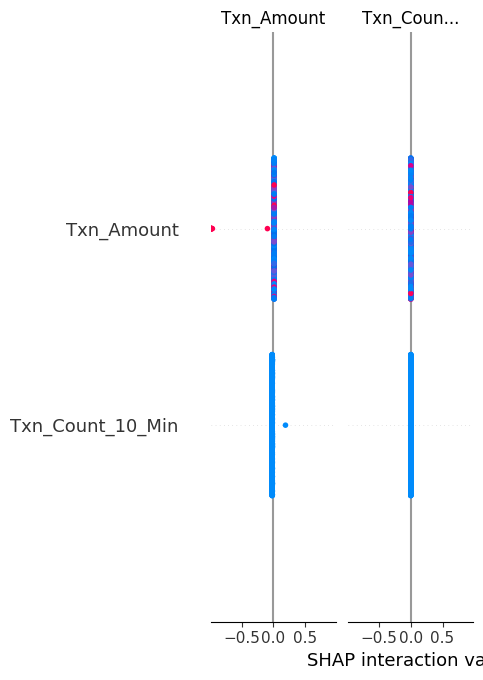

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Weight,Feature
0.9997 ± 0.0008,Txn_Amount
0.0003 ± 0.0008,Txn_Count_Today
0.0000 ± 0.0001,Txn_Count_1_Hour
0.0000 ± 0.0000,Txn_Count_10_Min
0.0000 ± 0.0000,Velocity_Flag_10_Min
0 ± 0.0000,Velocity_Flag_1_Hour
0 ± 0.0000,Velocity_Source_Flag


In [ ]:
# ===============================
# 🔹 1️⃣ Libraries
# ===============================
import pandas as pd
import numpy as np
import shap
import lime
import lime.lime_tabular
import eli5

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# from sklearn.preprocessing import LabelEncoder # Not needed if we select ml_features

# ===============================
# 🔹 2️⃣ Load Dataset (Removed reload as 'df' is already prepared in kernel)
# ===============================
# df = pd.read_csv("/content/synthetic_dataset_original.csv") # REMOVED THIS LINE

# ===============================
# 🔹 3️⃣ Preprocessing (Re-engineering features to ensure all are present)
# ===============================

# Remove potential 'index' column if it exists from prior resets or raw data
if 'index' in df.columns:
    df = df.drop(columns=['index'])

# 1️⃣ Ensure Create_Date is datetime and sort for rolling calculations
df["Create_Date"] = pd.to_datetime(df["Create_Date"])
df = df.sort_values(["User_ID", "Create_Date"]).reset_index(drop=True)

# 2️⃣ Set index for time-based rolling calculations
df = df.set_index("Create_Date")

# 3️⃣ 10-min rolling transaction count per user
df["Txn_Count_10_Min"] = df.groupby("User_ID")["User_ID"].rolling("10min").count().reset_index(level=0, drop=True)

# 4️⃣ 1-hour rolling transaction count per user
df["Txn_Count_1_Hour"] = df.groupby("User_ID")["User_ID"].rolling("1h").count().reset_index(level=0, drop=True)

# 5️⃣ Reset index to have Create_Date as column again
df = df.reset_index()

# 6️⃣ Daily transaction count
df["Txn_Date"] = df["Create_Date"].dt.date
df["Txn_Count_Today"] = df.groupby(["User_ID", "Txn_Date"])["Txn_ID"].transform("count")

# 7️⃣ Assign User_Class from profile (ensuring weighted_choice and user_class_dist are globally available)
def assign_user_class_helper(): # Renamed to avoid conflicts
    return weighted_choice(user_class_dist, "User_Class", "User_%")

user_class_map = {user: assign_user_class_helper() for user in df["User_ID"].unique()}
df["User_Class"] = df["User_ID"].map(user_class_map)

# 8️⃣ Velocity burst flags (10 min & 1 hour) using burst_pattern profile (burst_pattern is globally available)
burst_lookup = burst_pattern.set_index("User_Class")

df["Velocity_Flag_10_Min"] = df.apply(
    lambda r: int(r["Txn_Count_10_Min"] > burst_lookup.loc[r["User_Class"], "Max_Txn_in_10_Min"]),
    axis=1
)

df["Velocity_Flag_1_Hour"] = df.apply(
    lambda r: int(r["Txn_Count_1_Hour"] > burst_lookup.loc[r["User_Class"], "Max_Txn_in_1_Hour"]),
    axis=1
)

# 9️⃣ Velocity source limit flag (velocity_source_limit is globally available)
source_limit = velocity_source_limit.set_index("Tran_Source")
df["Velocity_Source_Flag"] = df.apply(
    lambda r: int(
        r["Txn_Count_1_Hour"] > source_limit.loc[r["Tran_Source"], "Max_Txn_per_Hour"]
        if r["Tran_Source"] in source_limit.index else 0
    ),
    axis=1
)

# 🔟 Calculate Velocity Risk
def map_velocity_risk_helper(row): # Renamed to avoid conflicts
    flags = [row["Velocity_Flag_10_Min"], row["Velocity_Flag_1_Hour"], row["Velocity_Source_Flag"]]
    count = sum(flags)

    if count >= 2:
        return "High"
    elif count == 1:
        return "Medium"
    else:
        return "Low"

df["Velocity_Risk"] = df.apply(map_velocity_risk_helper, axis=1)

# 1️⃣1️⃣ Add Fraud Label (Night_Risk_Flag and Geo_Risk_Flag might not be present, so .get handles default to 0)
df["Fraud_Label"] = (
    (df["Velocity_Risk"] == "High") |
    ((df.get("Night_Risk_Flag", 0) == 1) & (df.get("Geo_Risk_Flag", 0) == 1)) |
    (df["Txn_Amount"] > df["Txn_Amount"].quantile(0.99))
).astype(int)

# Define ml_features (ensure it's consistent with what's being used)
ml_features = [
    "Txn_Amount",
    "Txn_Count_10_Min",
    "Txn_Count_1_Hour",
    "Txn_Count_Today",
    "Velocity_Flag_10_Min",
    "Velocity_Flag_1_Hour",
    "Velocity_Source_Flag"
]

X = df[ml_features] # Select only the relevant ML features
y = df["Fraud_Label"] # Explicitly get the target variable

# ===============================
# 🔹 4️⃣ Stratified K-Fold setup
# ===============================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

metrics = {"accuracy": [], "precision": [], "recall": [], "f1": []}

# Store models and SHAP explainers
models = []
shap_values_all = []

fold = 1
# Keep track of the test_idx from the last fold to use with SHAP/LIME/ELI5 plots
last_test_idx = None
last_train_idx = None

for train_idx, test_idx in skf.split(X, y):
    print(f"\n=== Fold {fold} ===")

    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Store indices for the last fold
    if fold == skf.n_splits:
        last_test_idx = test_idx
        last_train_idx = train_idx

    # ===============================
    # 🔹 5️⃣ Random Forest Classifier
    # ===============================
    rf = RandomForestClassifier(n_estimators=100, max_depth=7, random_state=42)
    rf.fit(X_train, y_train)

    y_pred = rf.predict(X_test)

    # Metrics
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, zero_division=0)
    rec = recall_score(y_test, y_pred, zero_division=0)
    f1 = f1_score(y_test, y_pred, zero_division=0)

    print(f"Accuracy: {acc:.4f} | Precision: {prec:.4f} | Recall: {rec:.4f} | F1: {f1:.4f}")

    metrics["accuracy"].append(acc)
    metrics["precision"].append(prec)
    metrics["recall"].append(rec)
    metrics["f1"].append(f1)

    models.append(rf)

    # ===============================
    # 6️⃣ SHAP Explainer for this fold
    # ===============================
    explainer = shap.TreeExplainer(rf)
    shap_vals = explainer.shap_values(X_test)
    shap_values_all.append(shap_vals)

    fold += 1

# ===============================
# 🔹 7️⃣ Average Metrics Across Folds
# ===============================
print("\n=== Average Metrics Across 5 Folds ===")
for m, vals in metrics.items():
    print(f"{m}: {np.mean(vals):.4f} \u00b1 {np.std(vals):.4f}")

# ===============================
# 🔹 8️⃣ SHAP Summary Plot (last fold example)
# ===============================
# Use the X_test from the last fold to match the shap_values
X_test_last_fold = X.iloc[last_test_idx]
# Pass the full shap_values (list of arrays) and specify class_inds=1 for the fraud class
shap.summary_plot(shap_values_all[-1], X_test_last_fold, plot_type="bar", class_inds=1)

# ===============================
# 🔹 9️⃣ LIME Explainer (last fold, RF)
# ===============================
# Use the X_train from the last fold to train the LIME explainer
X_train_last_fold = X.iloc[last_train_idx]

lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_last_fold.values,
    feature_names=X_train_last_fold.columns.tolist(),
    class_names=["Non-Fraud", "Fraud"],
    mode="classification"
)

i = 0  # pick the first test sample from the last fold
lime_exp = lime_explainer.explain_instance(
    X_test_last_fold.values[i],
    models[-1].predict_proba, # Use the last trained RF model
    num_features=10
)
lime_exp.show_in_notebook()

# ===============================
# 🔹 10️⃣ ELI5 Feature Weights
# ===============================
eli5.show_weights(models[-1], feature_names=X_train_last_fold.columns.tolist()) # Use the last trained RF model and features

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Create_Date           5000 non-null   datetime64[ns]
 1   Txn_ID                5000 non-null   object        
 2   User_ID               5000 non-null   object        
 3   Tran_Source           5000 non-null   object        
 4   Txn_Amount            5000 non-null   float64       
 5   From_Account          5000 non-null   object        
 6   To_Account            5000 non-null   object        
 7   Resp_Code             5000 non-null   int64         
 8   Tracer_No             5000 non-null   int64         
 9   Txn_Type              5000 non-null   object        
 10  Particulars           5000 non-null   object        
 11  Remarks               5000 non-null   object        
 12  Device                5000 non-null   object        
 13  IP_A

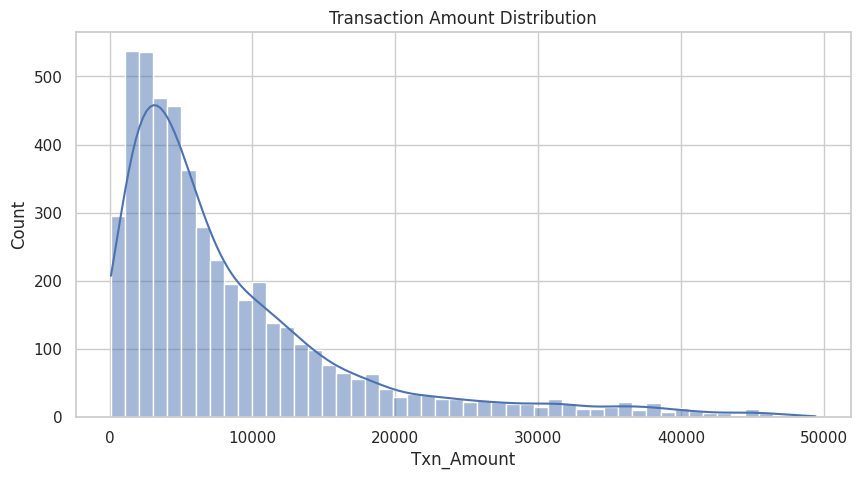

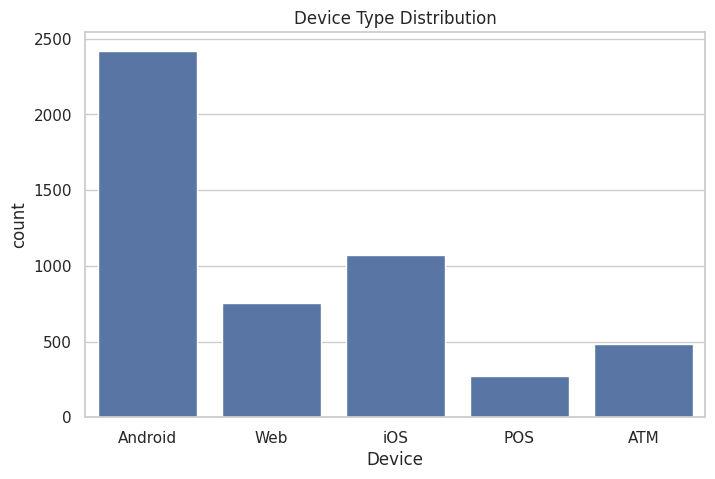

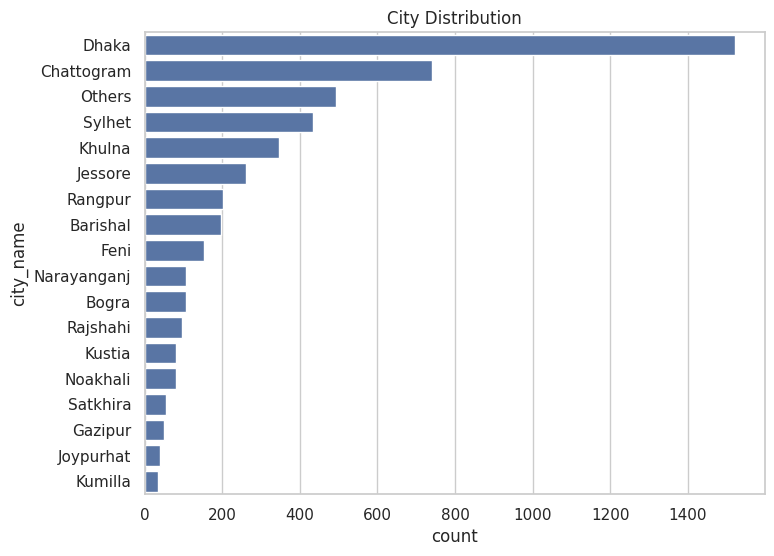

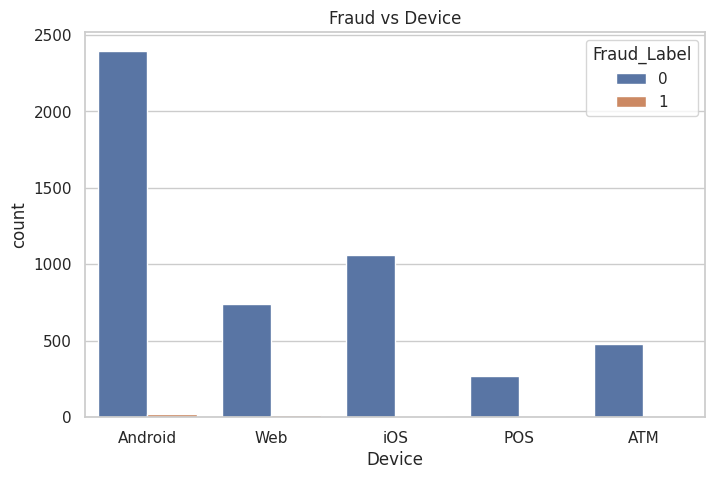

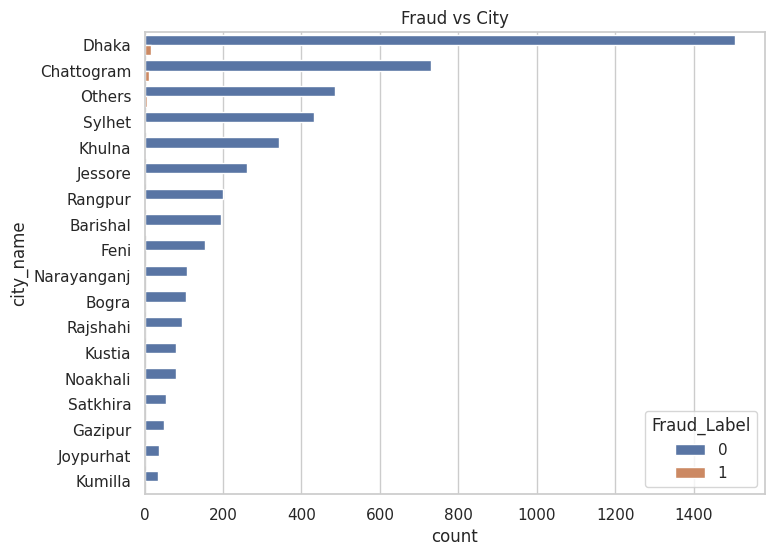

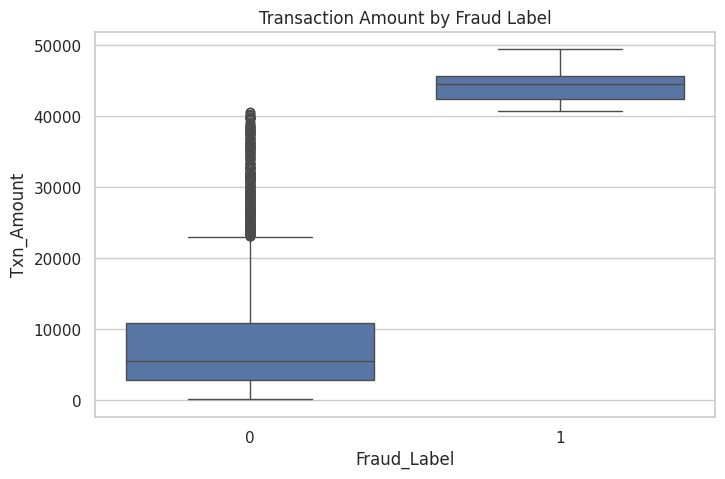

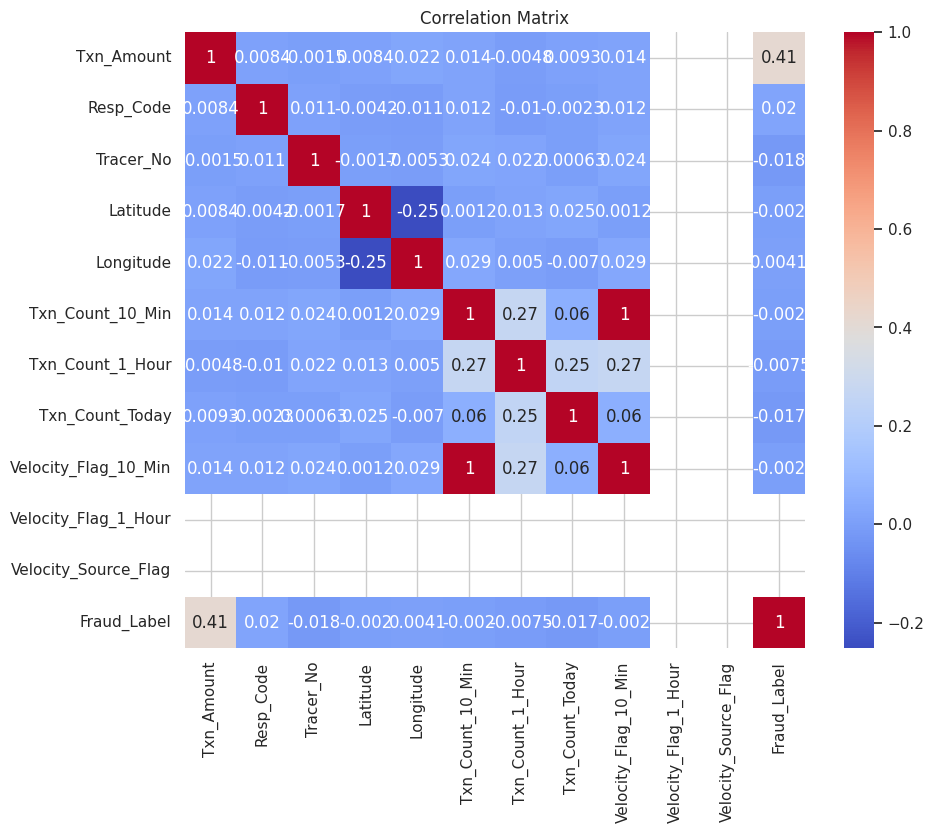

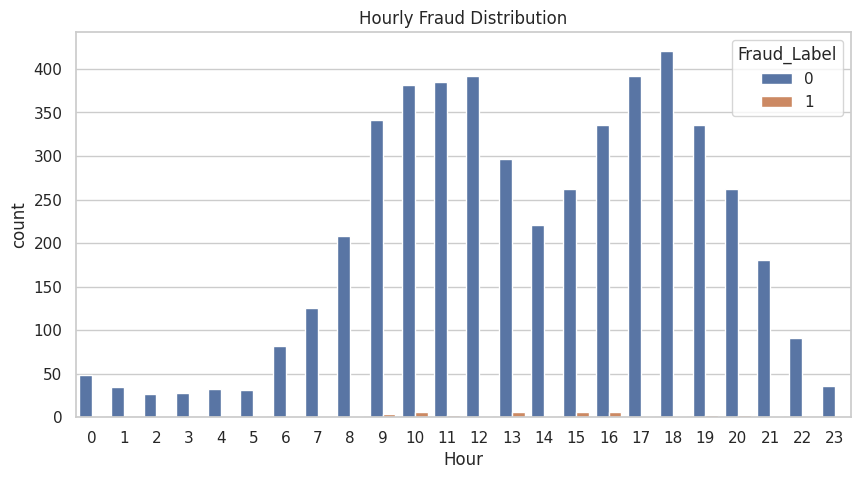

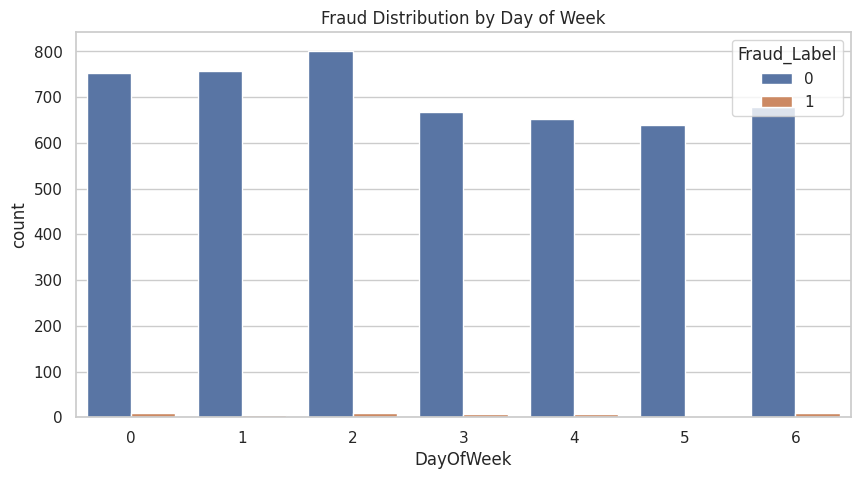

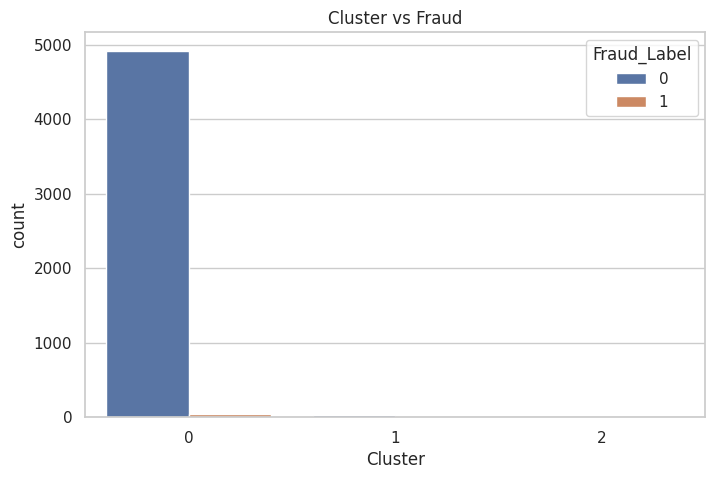


✅ EDA Completed!


In [ ]:
# =========================
# 🔹 Full Exploratory Data Analysis (EDA)
# =========================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

sns.set(style="whitegrid")

# -------------------------
# 1️⃣ Overview
# -------------------------
print("Dataset Info:")
print(df.info(), "\n")
print("Dataset Description:")
print(df.describe(include='all'), "\n")
print("Missing Values:")
print(df.isnull().sum(), "\n")
print("Fraud_Label Distribution:")
print(df['Fraud_Label'].value_counts(normalize=True) * 100, "\n")

# -------------------------
# 2️⃣ Univariate Analysis
# -------------------------
# Numeric: Txn_Amount
plt.figure(figsize=(10,5))
sns.histplot(df['Txn_Amount'], bins=50, kde=True)
plt.title('Transaction Amount Distribution')
plt.show()

# Categorical: Device
plt.figure(figsize=(8,5))
sns.countplot(x='Device', data=df)
plt.title('Device Type Distribution')
plt.show()

# Categorical: City
plt.figure(figsize=(8,6))
sns.countplot(y='city_name', data=df, order=df['city_name'].value_counts().index)
plt.title('City Distribution')
plt.show()

# -------------------------
# 3️⃣ Bivariate Analysis
# -------------------------
# Fraud vs Device
plt.figure(figsize=(8,5))
sns.countplot(x='Device', hue='Fraud_Label', data=df)
plt.title('Fraud vs Device')
plt.show()

# Fraud vs City
plt.figure(figsize=(8,6))
sns.countplot(y='city_name', hue='Fraud_Label', data=df,
              order=df['city_name'].value_counts().index)
plt.title('Fraud vs City')
plt.show()

# Amount vs Fraud
plt.figure(figsize=(8,5))
sns.boxplot(x='Fraud_Label', y='Txn_Amount', data=df)
plt.title('Transaction Amount by Fraud Label')
plt.show()

# -------------------------
# 4️⃣ Numeric Correlation
# -------------------------
plt.figure(figsize=(10,8))
numeric_cols = df.select_dtypes(include='number').columns
corr_matrix = df[numeric_cols].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# -------------------------
# 5️⃣ Temporal Analysis
# -------------------------
df['Hour'] = df['Create_Date'].dt.hour
df['DayOfWeek'] = df['Create_Date'].dt.dayofweek

plt.figure(figsize=(10,5))
sns.countplot(x='Hour', hue='Fraud_Label', data=df)
plt.title('Hourly Fraud Distribution')
plt.show()

plt.figure(figsize=(10,5))
sns.countplot(x='DayOfWeek', hue='Fraud_Label', data=df)
plt.title('Fraud Distribution by Day of Week')
plt.show()

# -------------------------
# 6️⃣ Optional: External Dataset Comparison
# -------------------------
# Uncomment & provide df_ext if available
# sns.kdeplot(df['Txn_Amount'], label='Current Dataset')
# sns.kdeplot(df_ext['Txn_Amount'], label='External Dataset')
# plt.title('Txn Amount Distribution Comparison')
# plt.legend()
# plt.show()

# -------------------------
# 7️⃣ Clustering Analysis
# -------------------------
features = ['Txn_Amount', 'Txn_Count_10_Min', 'Txn_Count_1_Hour']
df[features] = df[features].fillna(0)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features])

kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

plt.figure(figsize=(8,5))
sns.countplot(x='Cluster', hue='Fraud_Label', data=df)
plt.title('Cluster vs Fraud')
plt.show()

print("\n✅ EDA Completed!")


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Create_Date           5000 non-null   datetime64[ns]
 1   Txn_ID                5000 non-null   object        
 2   User_ID               5000 non-null   object        
 3   Tran_Source           5000 non-null   object        
 4   Txn_Amount            5000 non-null   float64       
 5   From_Account          5000 non-null   object        
 6   To_Account            5000 non-null   object        
 7   Resp_Code             5000 non-null   int64         
 8   Tracer_No             5000 non-null   int64         
 9   Txn_Type              5000 non-null   object        
 10  Particulars           5000 non-null   object        
 11  Remarks               5000 non-null   object        
 12  Device                5000 non-null   object        
 13  IP_A

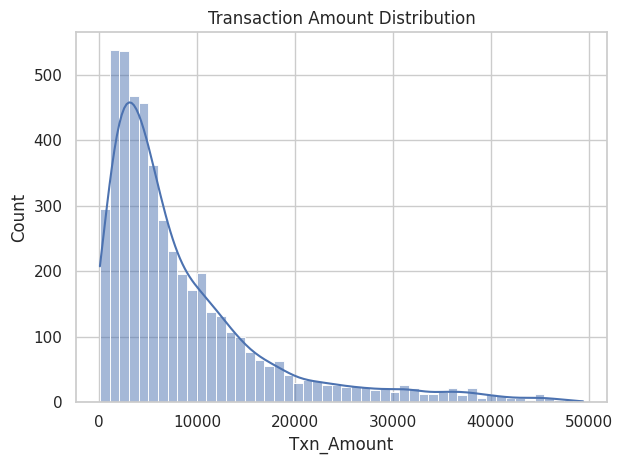

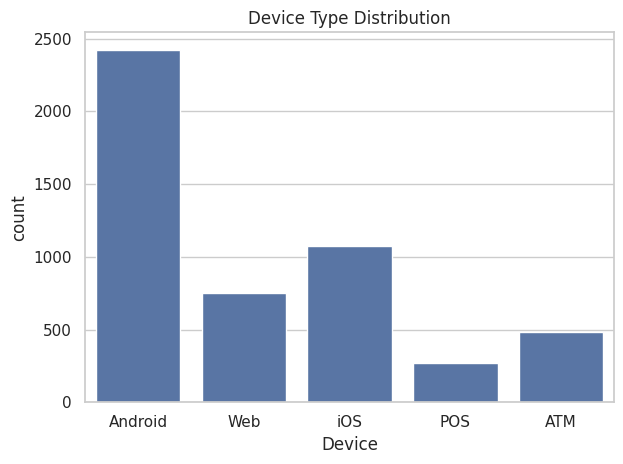

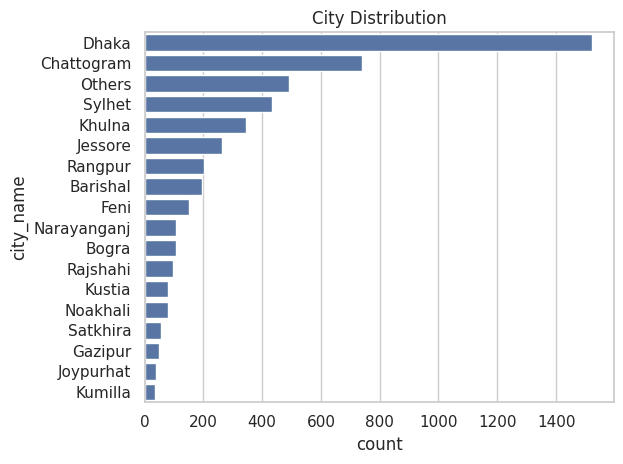

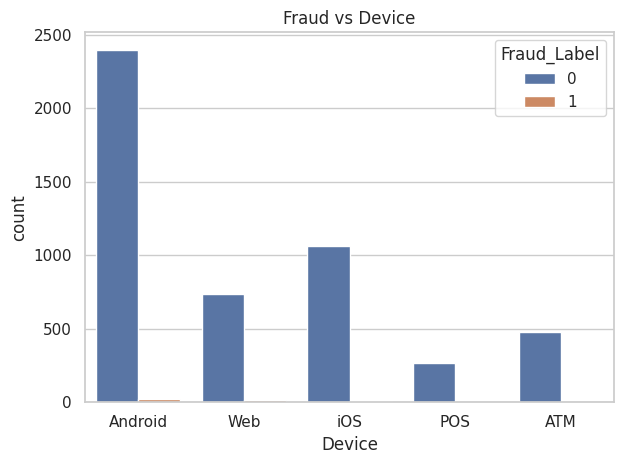

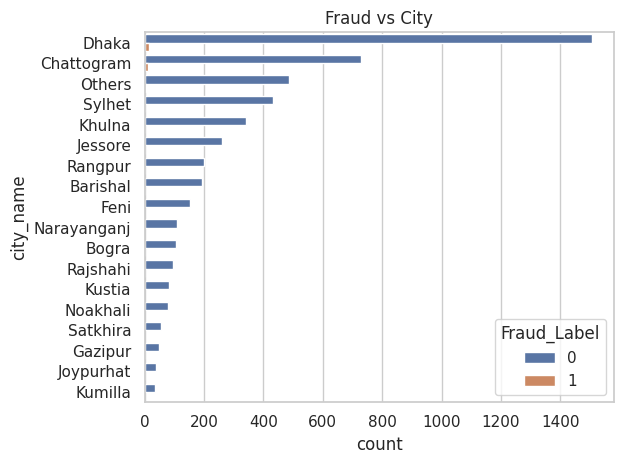

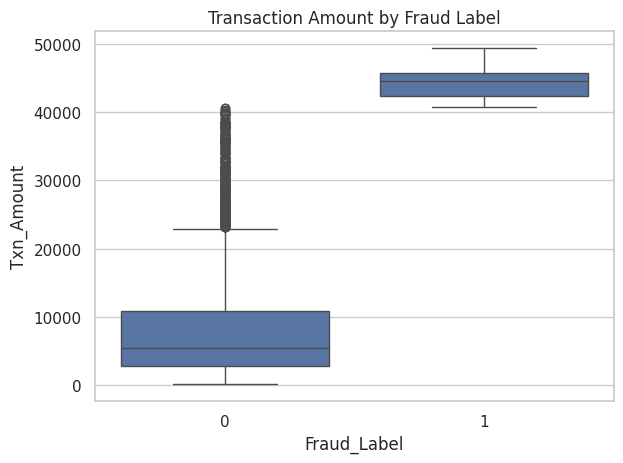

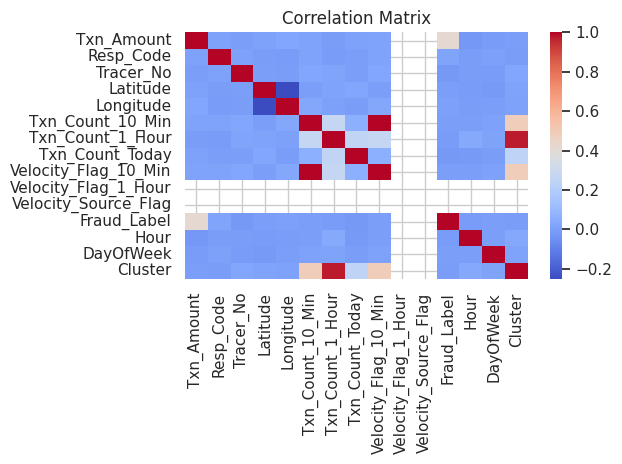

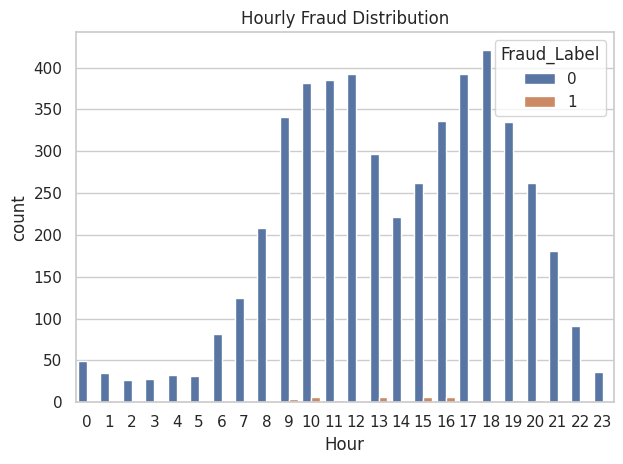

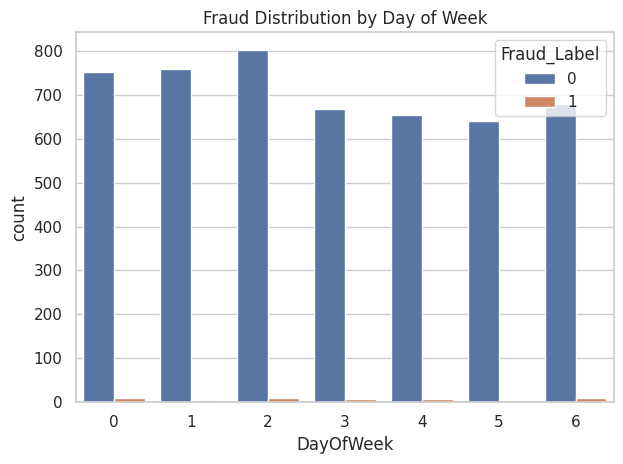

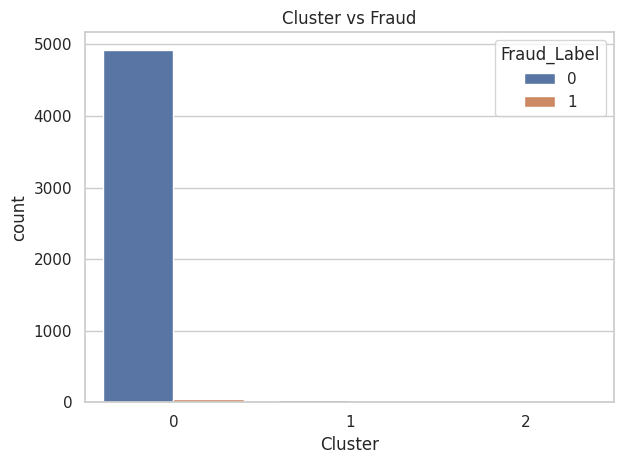


✅ EDA Completed with SVG Outputs!


In [ ]:
# =========================
# 🔹 Full Exploratory Data Analysis (EDA) — SVG Export Enabled
# =========================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

sns.set(style="whitegrid")

# -------------------------
# 1️⃣ Overview
# -------------------------
print("Dataset Info:")
print(df.info(), "\n")

print("Dataset Description:")
print(df.describe(include='all'), "\n")

print("Missing Values:")
print(df.isnull().sum(), "\n")

print("Fraud_Label Distribution (%):")
print(df['Fraud_Label'].value_counts(normalize=True) * 100, "\n")

# -------------------------
# 2️⃣ Univariate Analysis
# -------------------------
# Numeric: Txn_Amount
plt.figure()
sns.histplot(df['Txn_Amount'], bins=50, kde=True)
plt.title('Transaction Amount Distribution')
plt.tight_layout()
plt.savefig("eda_txn_amount_distribution.svg", format="svg")
plt.show()

# Categorical: Device
plt.figure()
sns.countplot(x='Device', data=df)
plt.title('Device Type Distribution')
plt.tight_layout()
plt.savefig("eda_device_distribution.svg", format="svg")
plt.show()

# Categorical: City
plt.figure()
sns.countplot(
    y='city_name',
    data=df,
    order=df['city_name'].value_counts().index
)
plt.title('City Distribution')
plt.tight_layout()
plt.savefig("eda_city_distribution.svg", format="svg")
plt.show()

# -------------------------
# 3️⃣ Bivariate Analysis
# -------------------------
# Fraud vs Device
plt.figure()
sns.countplot(x='Device', hue='Fraud_Label', data=df)
plt.title('Fraud vs Device')
plt.tight_layout()
plt.savefig("eda_fraud_vs_device.svg", format="svg")
plt.show()

# Fraud vs City
plt.figure()
sns.countplot(
    y='city_name',
    hue='Fraud_Label',
    data=df,
    order=df['city_name'].value_counts().index
)
plt.title('Fraud vs City')
plt.tight_layout()
plt.savefig("eda_fraud_vs_city.svg", format="svg")
plt.show()

# Amount vs Fraud
plt.figure()
sns.boxplot(x='Fraud_Label', y='Txn_Amount', data=df)
plt.title('Transaction Amount by Fraud Label')
plt.tight_layout()
plt.savefig("eda_amount_by_fraud.svg", format="svg")
plt.show()

# -------------------------
# 4️⃣ Numeric Correlation
# -------------------------
plt.figure()
numeric_cols = df.select_dtypes(include='number').columns
corr_matrix = df[numeric_cols].corr()
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.tight_layout()
plt.savefig("eda_correlation_matrix.svg", format="svg")
plt.show()

# -------------------------
# 5️⃣ Temporal Analysis
# -------------------------
df['Hour'] = df['Create_Date'].dt.hour
df['DayOfWeek'] = df['Create_Date'].dt.dayofweek

plt.figure()
sns.countplot(x='Hour', hue='Fraud_Label', data=df)
plt.title('Hourly Fraud Distribution')
plt.tight_layout()
plt.savefig("eda_hourly_fraud.svg", format="svg")
plt.show()

plt.figure()
sns.countplot(x='DayOfWeek', hue='Fraud_Label', data=df)
plt.title('Fraud Distribution by Day of Week')
plt.tight_layout()
plt.savefig("eda_dayofweek_fraud.svg", format="svg")
plt.show()

# -------------------------
# 6️⃣ Optional: External Dataset Comparison
# -------------------------
# sns.kdeplot(df['Txn_Amount'], label='Current Dataset')
# sns.kdeplot(df_ext['Txn_Amount'], label='External Dataset')
# plt.title('Txn Amount Distribution Comparison')
# plt.legend()
# plt.tight_layout()
# plt.savefig("eda_external_dataset_comparison.svg", format="svg")
# plt.show()

# -------------------------
# 7️⃣ Clustering Analysis
# -------------------------
features = ['Txn_Amount', 'Txn_Count_10_Min', 'Txn_Count_1_Hour']
df[features] = df[features].fillna(0)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features])

kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(X_scaled)

plt.figure()
sns.countplot(x='Cluster', hue='Fraud_Label', data=df)
plt.title('Cluster vs Fraud')
plt.tight_layout()
plt.savefig("eda_cluster_vs_fraud.svg", format="svg")
plt.show()

print("\n✅ EDA Completed with SVG Outputs!")


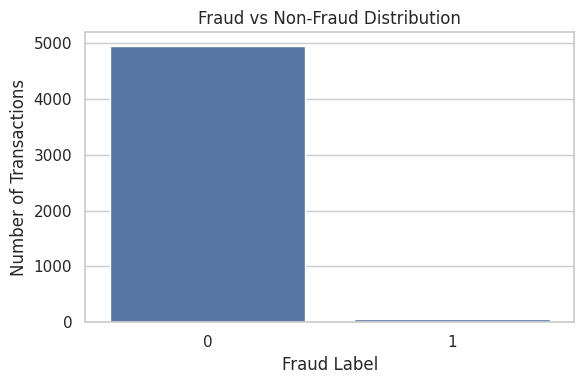

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6,4))
sns.countplot(x='Fraud_Label', data=df)
plt.title('Fraud vs Non-Fraud Distribution')
plt.xlabel('Fraud Label')
plt.ylabel('Number of Transactions')
plt.tight_layout()
plt.savefig("fraud_distribution.png", dpi=300)
plt.show()


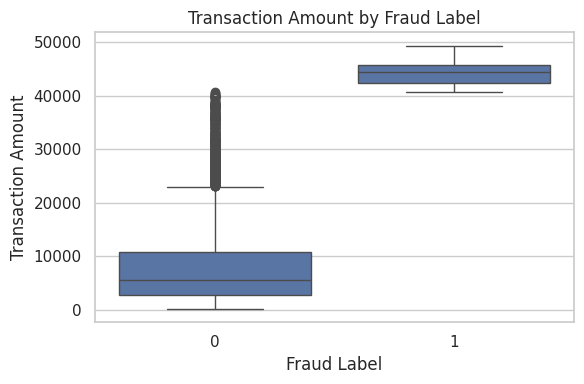

In [ ]:
plt.figure(figsize=(6,4))
sns.boxplot(x='Fraud_Label', y='Txn_Amount', data=df)
plt.title('Transaction Amount by Fraud Label')
plt.xlabel('Fraud Label')
plt.ylabel('Transaction Amount')
plt.tight_layout()
plt.savefig("amount_vs_fraud.png", dpi=300)
plt.show()


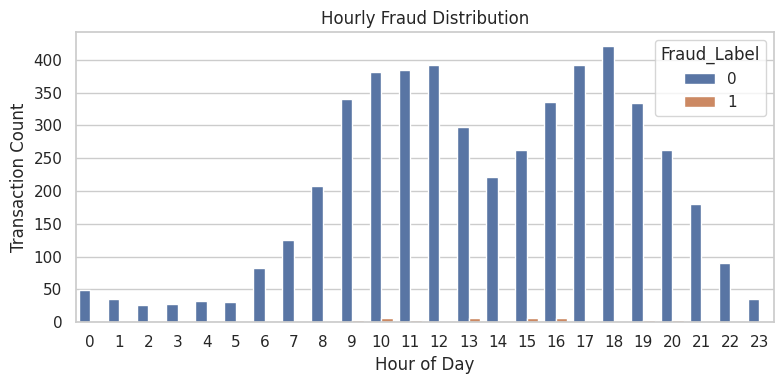

In [ ]:
df['Hour'] = df['Create_Date'].dt.hour

plt.figure(figsize=(8,4))
sns.countplot(x='Hour', hue='Fraud_Label', data=df)
plt.title('Hourly Fraud Distribution')
plt.xlabel('Hour of Day')
plt.ylabel('Transaction Count')
plt.tight_layout()
plt.savefig("hourly_fraud_pattern.png", dpi=300)
plt.show()


<Figure size 1200x1200 with 0 Axes>

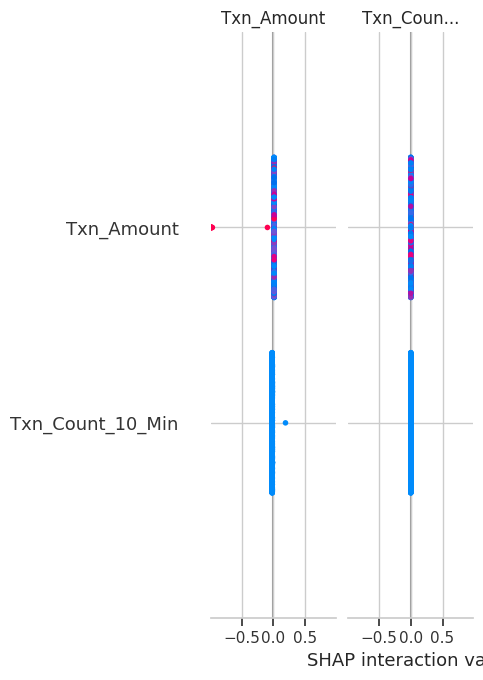

In [ ]:
import shap
import matplotlib.pyplot as plt

# Create a figure with landscape orientation
plt.figure(figsize=(12, 12))

# Using shap_values_all[-1] (from the last cross-validation fold)
# and X_test_last_fold for consistency.
shap.summary_plot(
    shap_values_all[-1],
    X_test_last_fold,
    plot_type="bar",
    show=False,
    class_inds=1 # Specify the fraud class if it's a binary classifier with 2 outputs
)

# Removed plt.tight_layout() as requested
plt.savefig("shap_feature_importance.png", dpi=300)
plt.show()

✅ Loaded df_alt from 'IB_20250901_20251101.xlsx'


,TXN_ID,USER_ID,TRAN_SESSION,TRAN_SOURCE,CREATE_DATE,TXN_AMOUNT,FROM_ACCOUNT,TO_ACCOUNT,RESP_CODE,TRACER_NO,TXN_TYPE,BEN_ID,REMARKS
0,317178,24472,719849,1,2025-09-05 23:39:33,50000.0,110112800000290,100190207212006,0.0,509253171786461,MGBL_OTHER_CARD,78954,payme card no#4529890300113220 name: MONOWAR H...
1,317193,61240,719955,1,2025-09-06 09:05:01,10.0,110712300001048,NaN,111.0,609253171935907,TOPUP,203349,IB: Topup to 01581498216
2,317256,18594,720389,1,2025-09-06 16:38:19,8800.0,900121600000015,900120600000326,0.0,609253172565435,OWN,66343,To GSS and Gmh :: 720389
3,317258,26940,720405,1,2025-09-06 16:55:45,5280.0,110112200002113,100190207212006,0.0,609253172586962,MY_CREDIT_CARD,0,Bill card no#4529890100190204 name: MD. REDWAN...
4,317282,12882,720562,1,2025-09-06 19:20:46,2000.0,110112200001563,110712100002175,0.0,609253172825271,OWN,79224,Arefin :: 720562


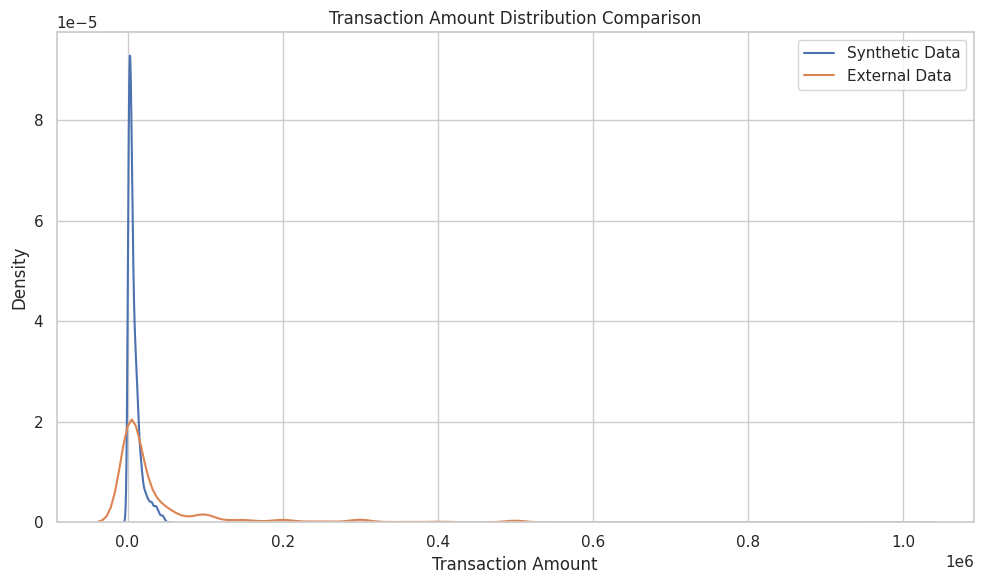

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Load the new dataset for df_alt
excel_path = '/content/drive/MyDrive/Sys_docs/IB_20250901_20251101.xlsx'
df_alt_sheets = load_excel(excel_path)

# Assuming the primary data is in the first sheet or has a relevant name
# For simplicity, taking the first sheet. Adjust if a specific sheet name is known.
if df_alt_sheets:
    df_alt = list(df_alt_sheets.values())[0]
    print("✅ Loaded df_alt from 'IB_20250901_20251101.xlsx'")
    display(df_alt.head())
else:
    print(f"❌ No sheets found in {excel_path}")
    df_alt = pd.DataFrame() # Create an empty DataFrame to avoid errors

# Revert to a general plot for report
plt.figure(figsize=(10,6)) # Increased figure size for better readability in a report
sns.kdeplot(df['Txn_Amount'], label='Synthetic Data') # More descriptive label
sns.kdeplot(df_alt['TXN_AMOUNT'], label='External Data') # More descriptive label
plt.title('Transaction Amount Distribution Comparison') # General title
plt.xlabel('Transaction Amount')
# plt.xlim(0.0, 0.4) # Removed x-axis limit to show full distribution
plt.ylabel('Density') # Added y-axis label for clarity
plt.legend()
plt.tight_layout()
plt.savefig("transaction_amount_distribution_report.png", dpi=300) # New filename for report
plt.show()